In [333]:
import csv
import numpy as np
from matplotlib import pyplot as plt 
import itertools

Python Standard Libraries (i.e. csv) are allowed, see "Using external libraries in utility functions" in discussion

- all variables are floating point, except PRI_jet_num which is integer

- variables prefixed with PRI (for PRImitives) are “raw” quantities about the bunch collision as measured by the detector.

- variables prefixed with DER (for DERived) are quantities computed from the primitive features, which were selected by the physicists of ATLAS.

- it can happen that for some entries some variables are meaningless or cannot be computed; in this case, their value is −999.0, which is outside the normal range of all variables.

In [2]:
data_path = "Data/train.csv"

dtypes = "i8,U5,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,i8,f8,f8,f8,f8,f8,f8,f8"
with open(data_path, 'r') as f:
    reader = csv.reader(f, delimiter=',')
    headers = next(reader)
data = np.genfromtxt(data_path, delimiter=",",names=True, dtype=dtypes)

In [3]:
for col in headers:
    print(col,"\t\t",type(data[col][0]) )

Id 		 <class 'numpy.int64'>
Prediction 		 <class 'numpy.str_'>
DER_mass_MMC 		 <class 'numpy.float64'>
DER_mass_transverse_met_lep 		 <class 'numpy.float64'>
DER_mass_vis 		 <class 'numpy.float64'>
DER_pt_h 		 <class 'numpy.float64'>
DER_deltaeta_jet_jet 		 <class 'numpy.float64'>
DER_mass_jet_jet 		 <class 'numpy.float64'>
DER_prodeta_jet_jet 		 <class 'numpy.float64'>
DER_deltar_tau_lep 		 <class 'numpy.float64'>
DER_pt_tot 		 <class 'numpy.float64'>
DER_sum_pt 		 <class 'numpy.float64'>
DER_pt_ratio_lep_tau 		 <class 'numpy.float64'>
DER_met_phi_centrality 		 <class 'numpy.float64'>
DER_lep_eta_centrality 		 <class 'numpy.float64'>
PRI_tau_pt 		 <class 'numpy.float64'>
PRI_tau_eta 		 <class 'numpy.float64'>
PRI_tau_phi 		 <class 'numpy.float64'>
PRI_lep_pt 		 <class 'numpy.float64'>
PRI_lep_eta 		 <class 'numpy.float64'>
PRI_lep_phi 		 <class 'numpy.float64'>
PRI_met 		 <class 'numpy.float64'>
PRI_met_phi 		 <class 'numpy.float64'>
PRI_met_sumet 		 <class 'numpy.float64'>
PRI_jet_nu

DER_mass_MMC


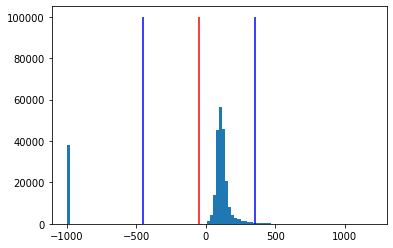

In [4]:
for col in headers[2:]:
    print(col)
    plt.hist(data[col],bins=100)
    plt.vlines(data[col].mean(),0,100000,"r")
    plt.vlines(data[col].mean()+data[col].std(),0,100000,"b")
    plt.vlines(data[col].mean()-data[col].std(),0,100000,"b")
    plt.show()
    break

## Sorting through NaN distribution in data

In [21]:
# REMOVING -999.0 values, turining to np.nan
data2 = data.copy()
nan_ind = []
for col in headers[2:]:
    for i in range(len(data2[col])):
        if data2[col][i] == -999.0:
            data2[col][i] = np.nan
            nan_ind.append(i)

nan_ind.sort()
nan_ind = list(set(nan_ind))

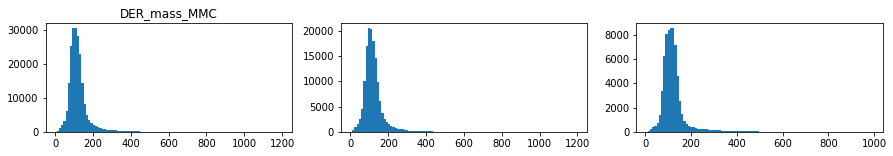

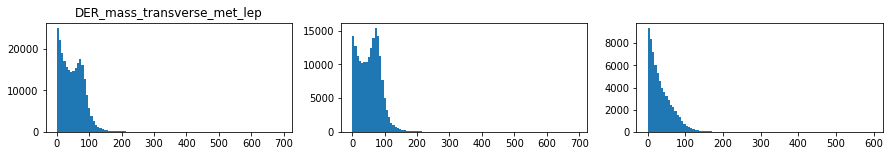

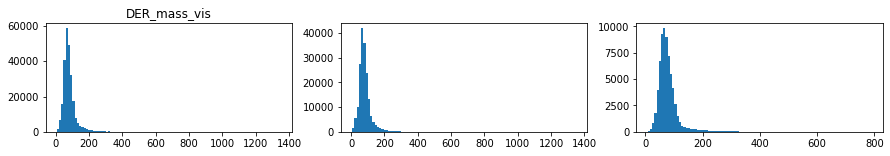

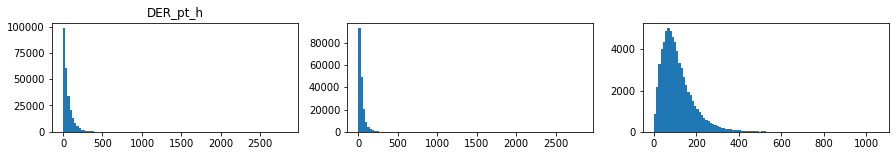

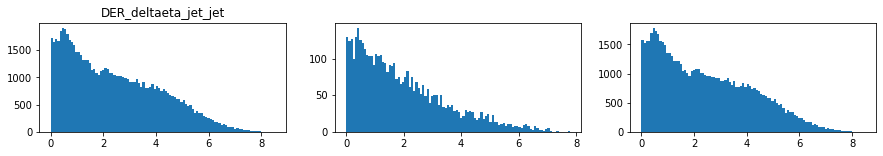

...

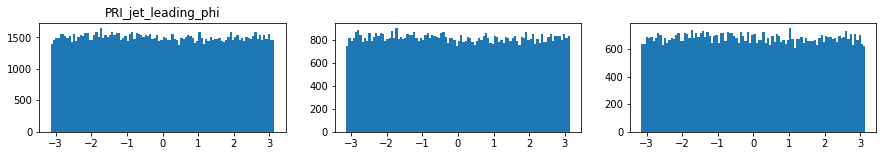

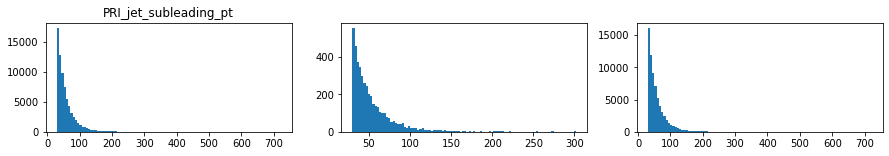

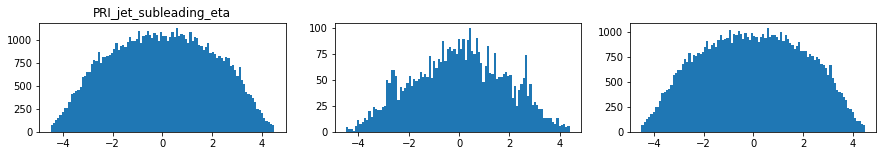

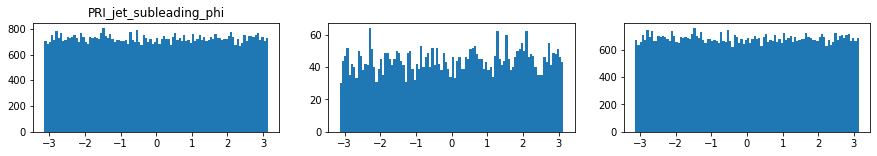

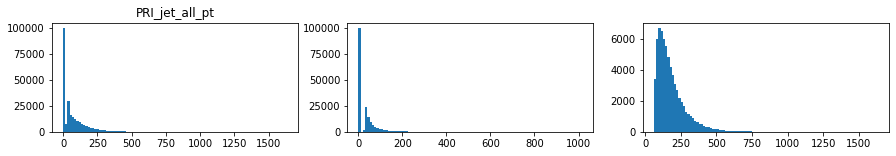

In [76]:
data_nan = data2[nan_ind]
data_com = data2.copy()
data_com = np.delete(data_com, nan_ind)

for col in headers[2:]:
    plt.figure(figsize=[15,2])
    
    plt.subplot(1,3,1)
    plt.hist(data2[col],bins=100)
    plt.title(col)
    
    plt.subplot(1,3,2)
    plt.hist(data_nan[col],bins=100)
    plt.subplot(1,3,3)
    plt.hist(data_com[col],bins=100)
    #plt.vlines(data2[col].mean(),0,100000,"r")
    #plt.vlines(data2[col].mean()+data2[col].std(),0,100000,"b")
    #plt.vlines(data2[col].mean()-data2[col].std(),0,100000,"b")
    plt.show()

In [ ]:
DER_pt_tot
Pri_tau_pt

DER_met_phi_centrality
DER_lep_eta_centrality


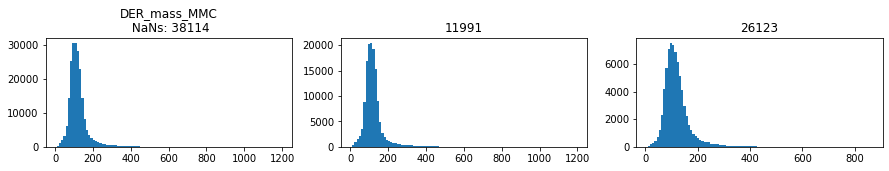

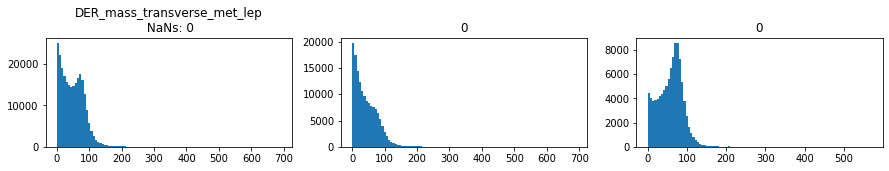

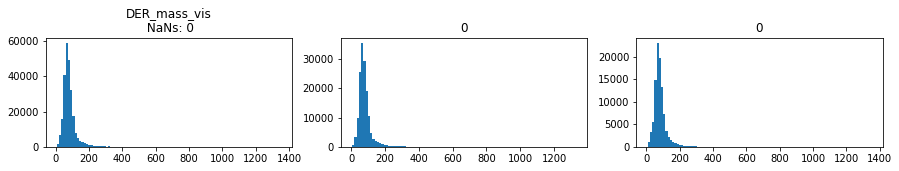

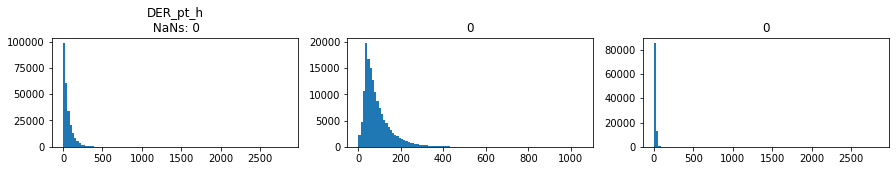

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6628: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6629: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


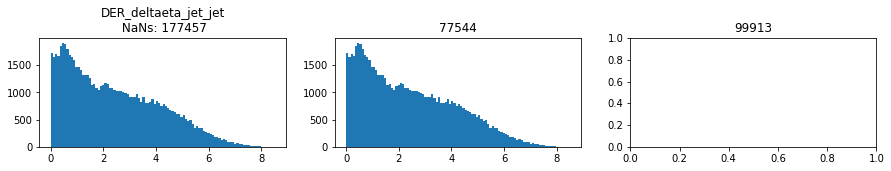

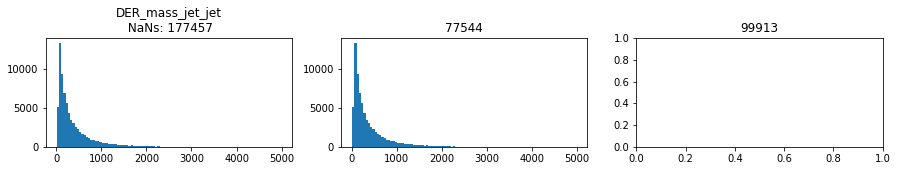

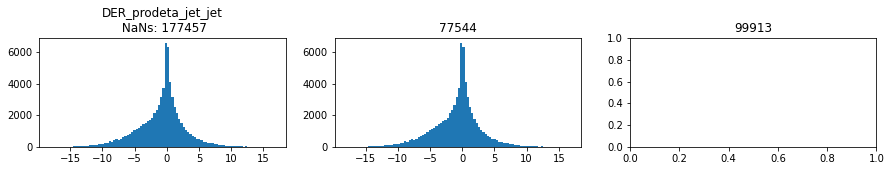

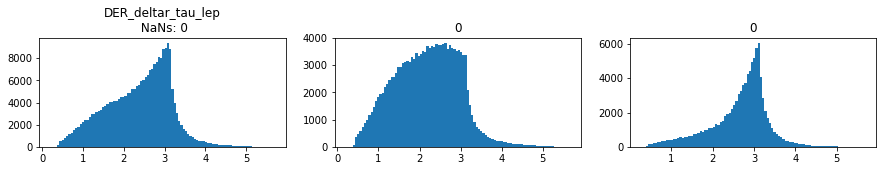

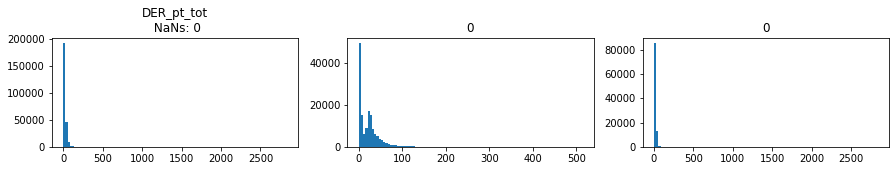

...

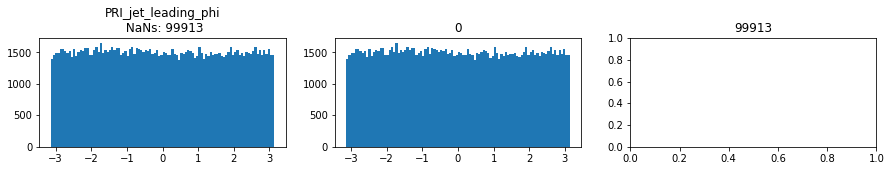

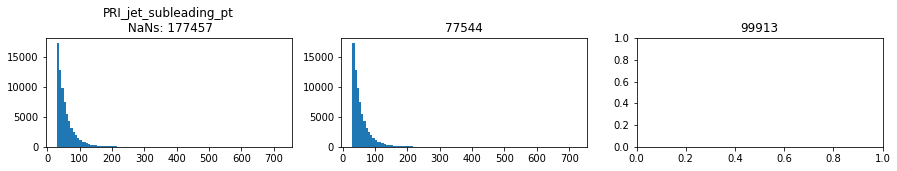

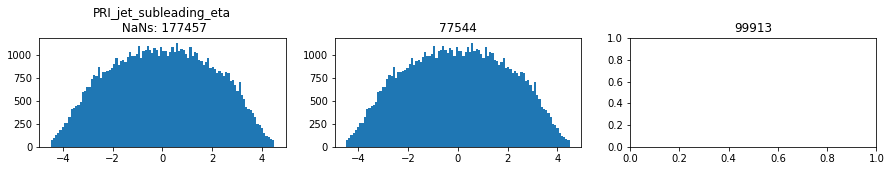

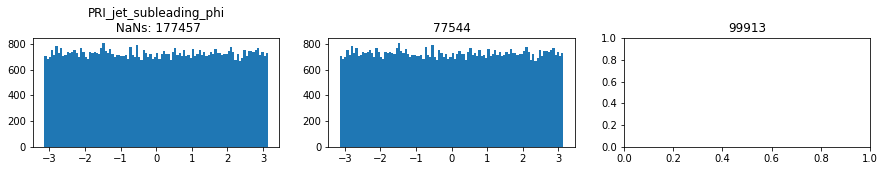

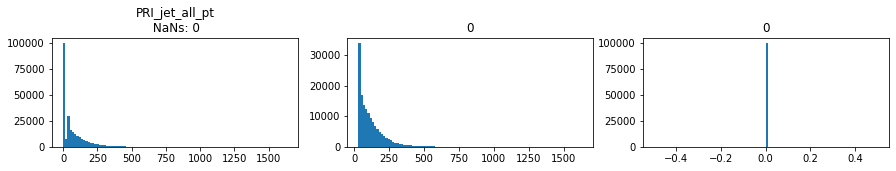

In [88]:
data_plt = data2[data2["PRI_jet_all_pt"]==0]
data_nplt = data2[data2["PRI_jet_all_pt"]!=0]

for col in headers[2:]:
    plt.figure(figsize=[15,2])
    
    plt.subplot(1,3,1)
    plt.hist(data2[col],bins=100)
    plt.title(col+"\n NaNs: "+str(np.isnan(data2[col]).sum()))
    
    plt.subplot(1,3,2)
    plt.hist(data_nplt[col],bins=100)
    plt.title(str(np.isnan(data_nplt[col]).sum()))
    
    try:
        plt.subplot(1,3,3)
        plt.title(str(np.isnan(data_plt[col]).sum()))
        plt.hist(data_plt[col],bins=100)
    except:
        continue
    
    plt.show()

In [98]:
data2[data2["PRI_jet_num"] == 3].shape[0]

22164

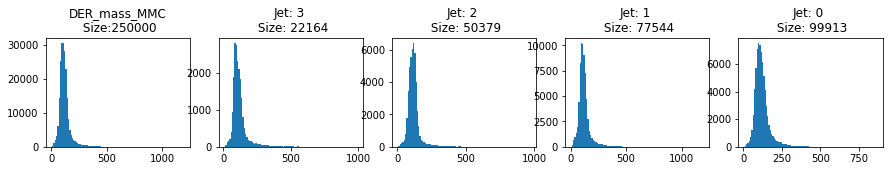

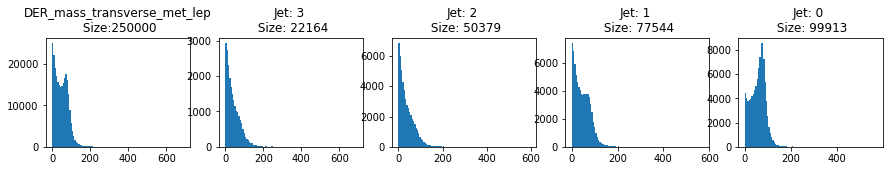

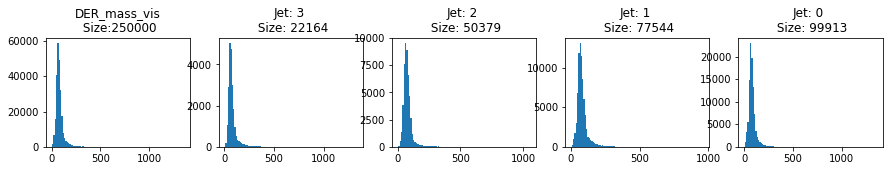

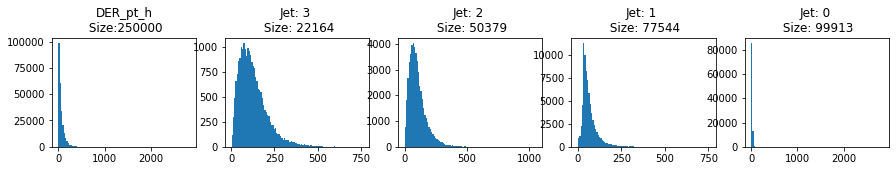

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6628: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6629: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:22: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:31: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes curre

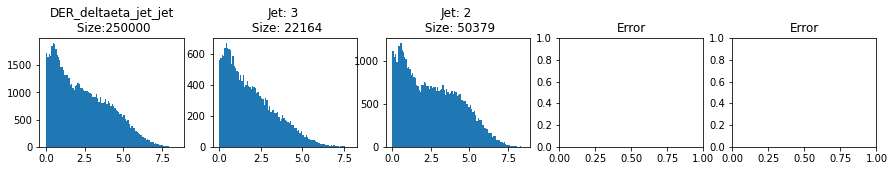

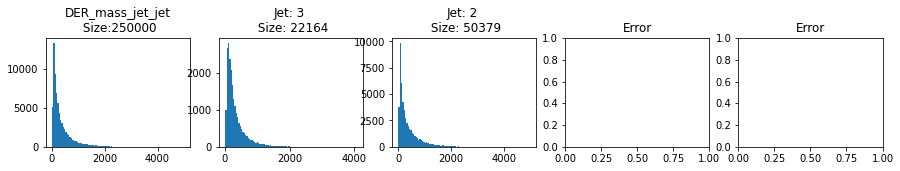

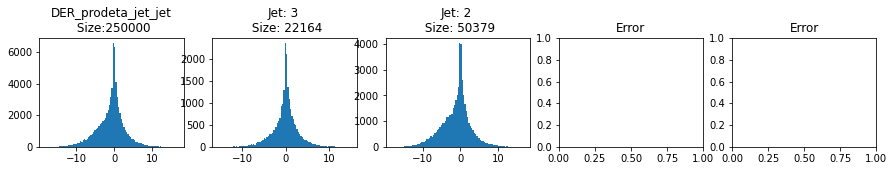

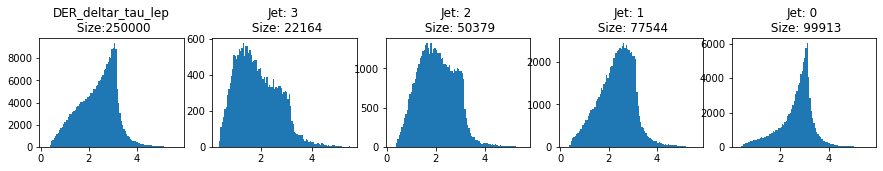

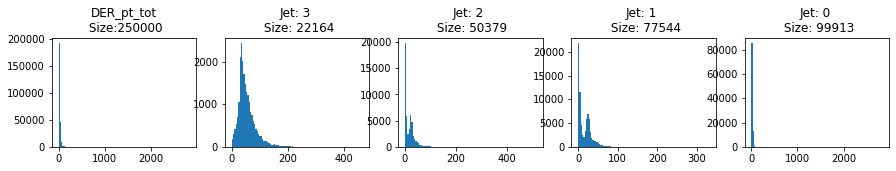

...

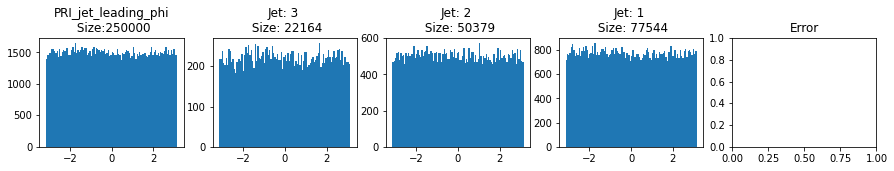

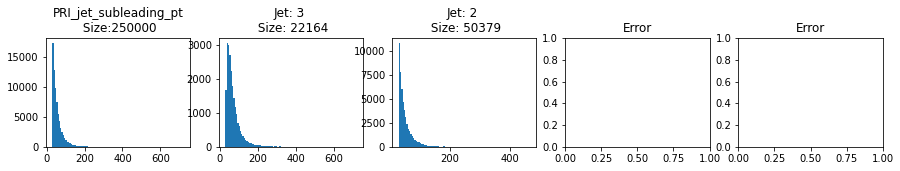

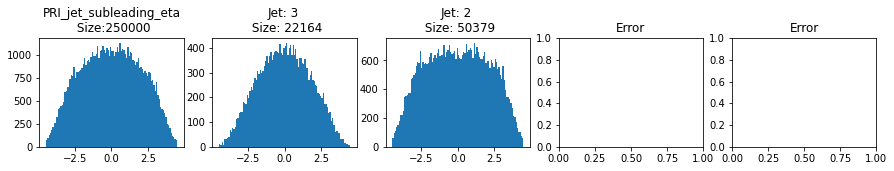

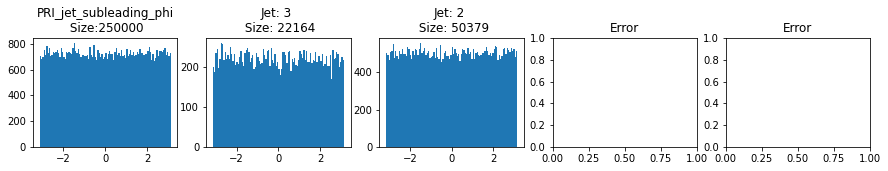

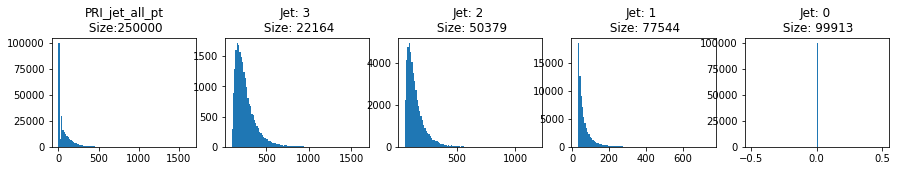

In [99]:

for col in headers[2:]:
    plt.figure(figsize=[15,2])
    
    plt.subplot(1,5,1)
    plt.hist(data2[col], bins=100)
    plt.title(col+"\n Size:"+str(data2[col].shape[0]))
    
    plt.subplot(1,5,2)
    plt.hist(data2[data2["PRI_jet_num"] == 3][col], bins=100)
    plt.title("Jet: 3 \n Size: "+str(data2[data2["PRI_jet_num"] == 3].shape[0]))
    
    plt.subplot(1,5,3)
    plt.hist(data2[data2["PRI_jet_num"] == 2][col], bins=100)
    plt.title("Jet: 2 \n Size: "+str(data2[data2["PRI_jet_num"] == 2].shape[0]))
    
    try:
        plt.subplot(1,5,4)
        plt.hist(data2[data2["PRI_jet_num"] == 1][col], bins=100)
        plt.title("Jet: 1 \n Size: "+str(data2[data2["PRI_jet_num"] == 1].shape[0]))
    except:
        plt.subplot(1,5,4)
        plt.title("Error")
        #continue
    
    try:
        plt.subplot(1,5,5)
        plt.hist(data2[data2["PRI_jet_num"] == 0][col], bins=100)
        plt.title("Jet: 0 \n Size: "+str(data2[data2["PRI_jet_num"] == 0].shape[0]))
    except:
        plt.subplot(1,5,5)
        plt.title("Error")
        #continue
    
    plt.show()


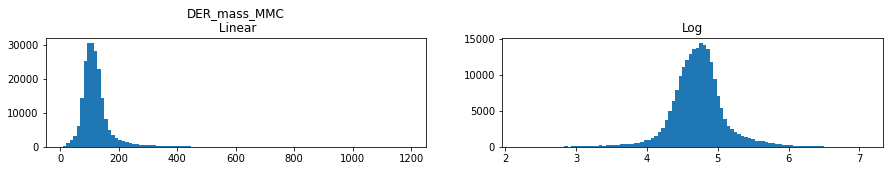

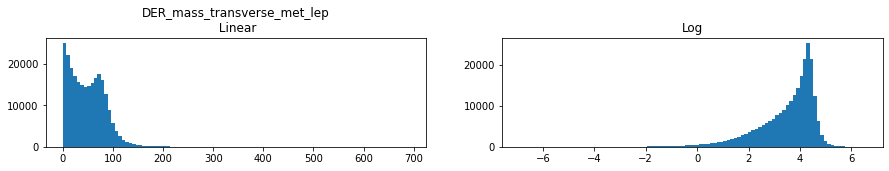

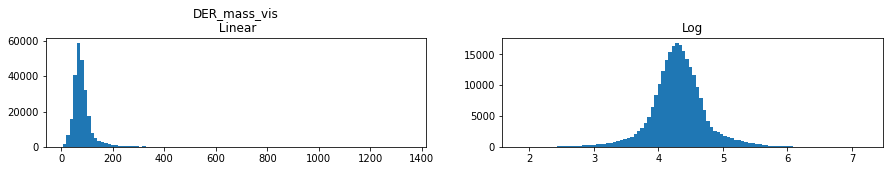

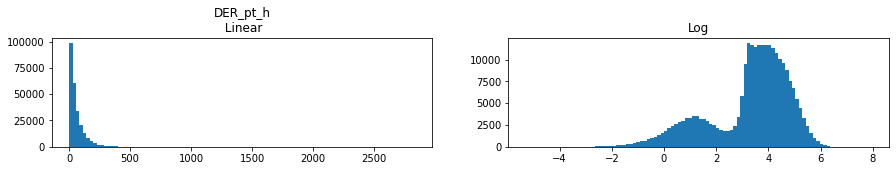

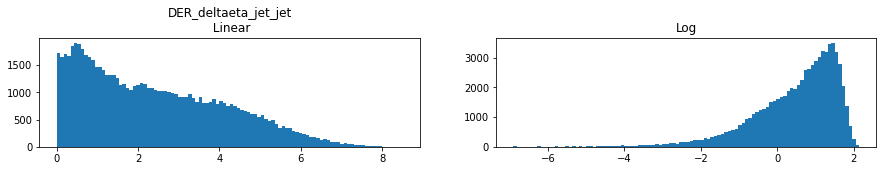

...

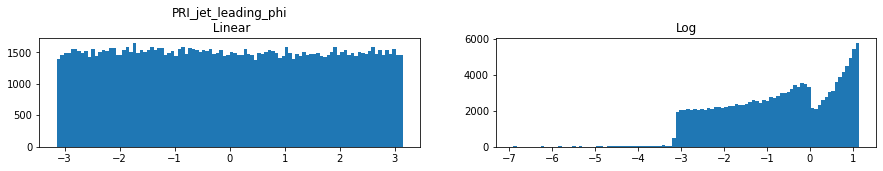

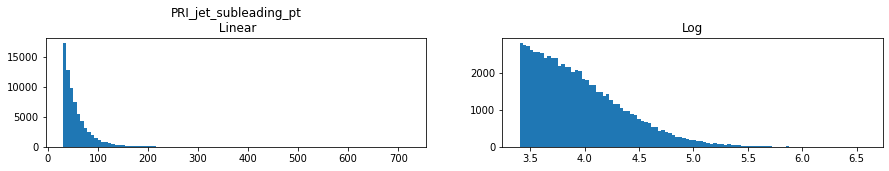

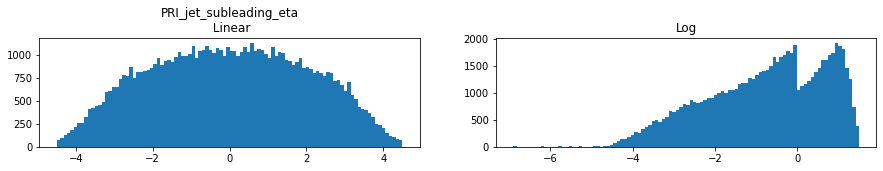

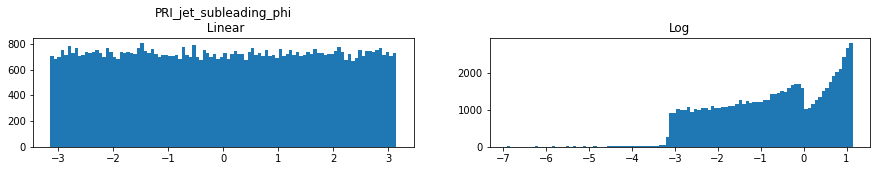

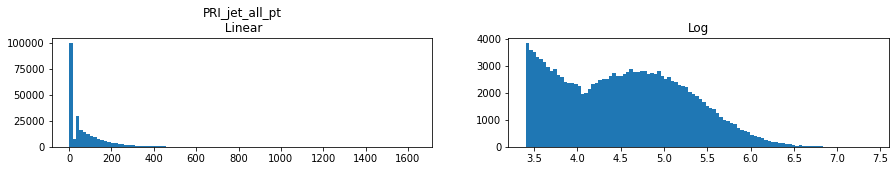

In [114]:
for col in headers[2:]:
    plt.figure(figsize=[15,2])
    
    plt.subplot(1,2,1)
    plt.hist(data2[col],bins=100)
    plt.title(col+"\n Linear")
    
    try:
        plt.subplot(1,2,2)
        #plt.hist([np.log(val) for val in data2[col]], bins=100)
        plt.hist(np.ma.log(data2[col]), bins=100)
        plt.title("Log")
    except:
        plt.subplot(1,2,2)
        plt.title("Error")
    
    
    plt.show()


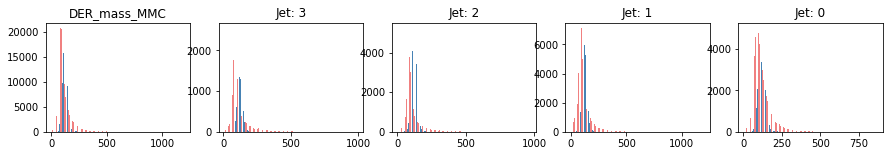

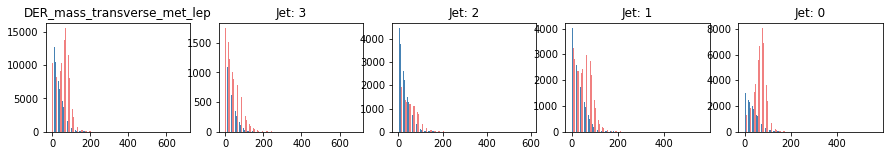

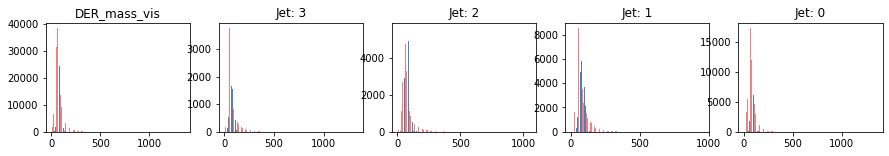

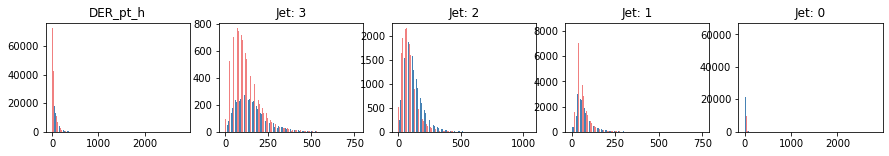

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6628: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6629: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:31: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:41: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes curre

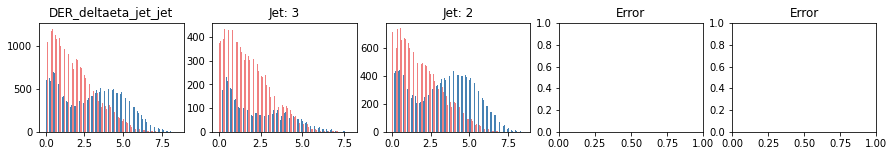

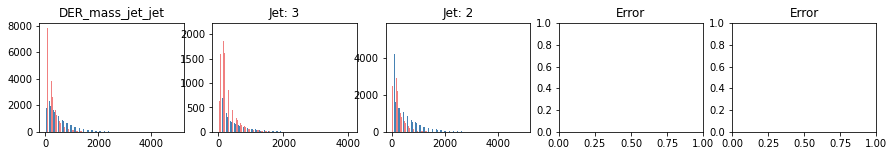

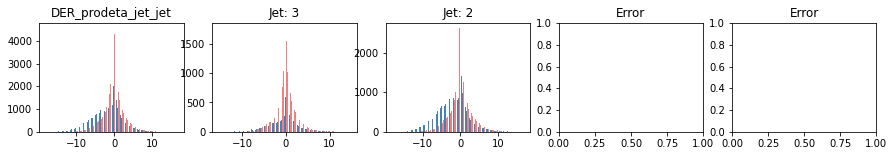

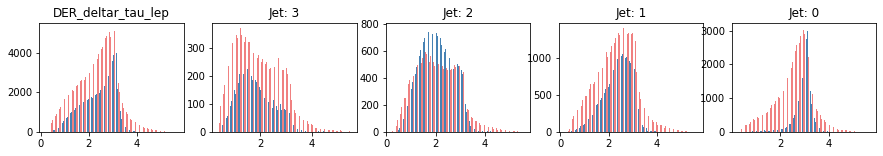

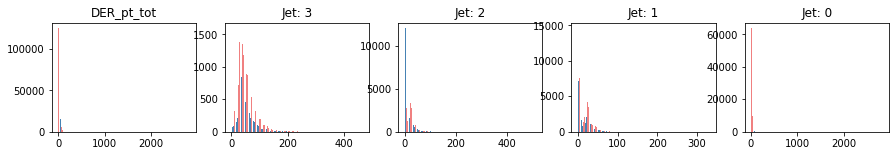

...

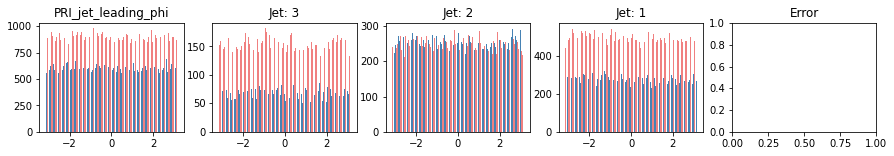

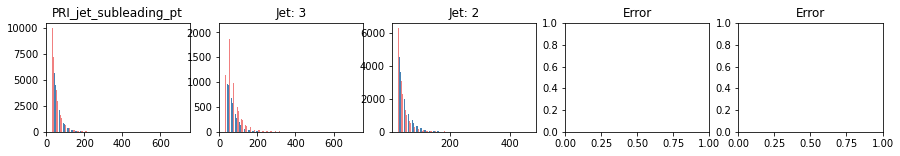

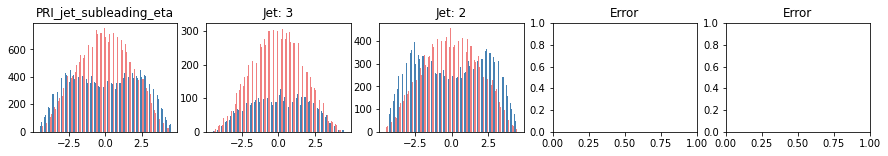

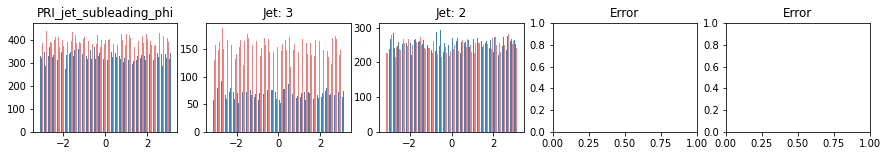

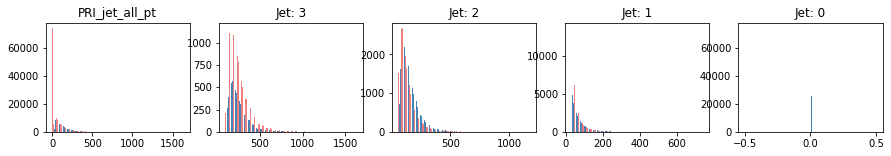

In [186]:
data_b = data2[data2["Prediction"]=='b']
data_s = data2[data2["Prediction"]=='s']

stack = False
colors = ['lightcoral', 'steelblue']

for col in headers[2:]:
    plt.figure(figsize=[15,2])
    
    plt.subplot(1,5,1)
    plt.hist([data_b[col], 
              data_s[col]], bins=100, stacked=stack, color=colors, label=colors)
    plt.title(col)
    
    plt.subplot(1,5,2)
    plt.hist([data_b[data_b["PRI_jet_num"] == 3][col], 
              data_s[data_s["PRI_jet_num"] == 3][col]], bins=100, stacked=stack, color=colors, label=colors)
    plt.title("Jet: 3")
    
    plt.subplot(1,5,3)
    plt.hist([data_b[data_b["PRI_jet_num"] == 2][col], 
              data_s[data_s["PRI_jet_num"] == 2][col]], bins=100, stacked=stack, color=colors, label=colors)
    plt.title("Jet: 2")
    
    try:
        plt.subplot(1,5,4)
        plt.hist([data_b[data_b["PRI_jet_num"] == 1][col], 
                  data_s[data_s["PRI_jet_num"] == 1][col]], bins=100, stacked=stack, color=colors, label=colors)
        plt.title("Jet: 1")
    except:
        plt.subplot(1,5,4)
        plt.title("Error")
        #continue
    
    try:
        plt.subplot(1,5,5)
        plt.hist([data_b[data_b["PRI_jet_num"] == 0][col], 
                  data_s[data_s["PRI_jet_num"] == 0][col]], bins=100, stacked=stack, color=colors, label=colors)
        plt.title("Jet: 0")
    except:
        plt.subplot(1,5,5)
        plt.title("Error")
        #continue
    
    plt.show()

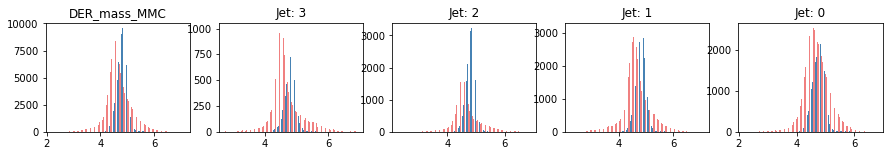

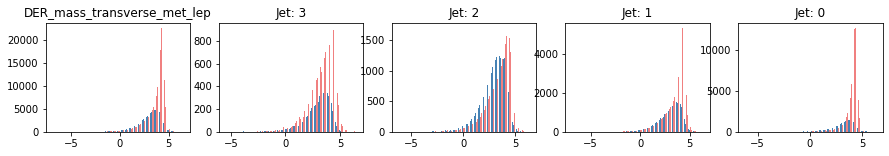

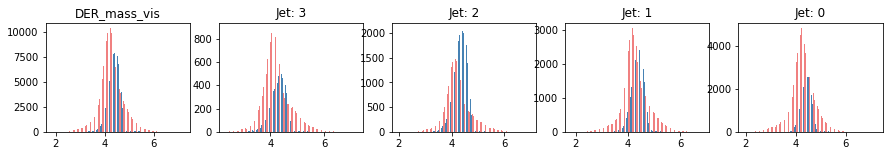

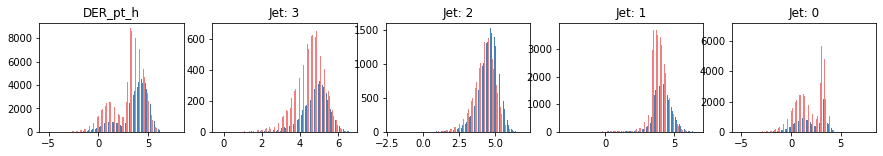

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:31: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:41: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


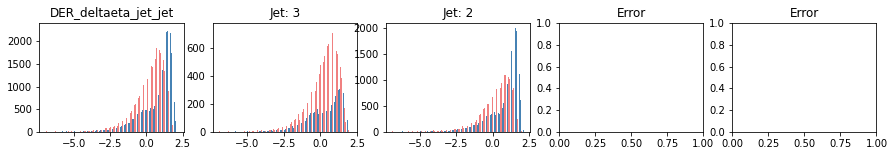

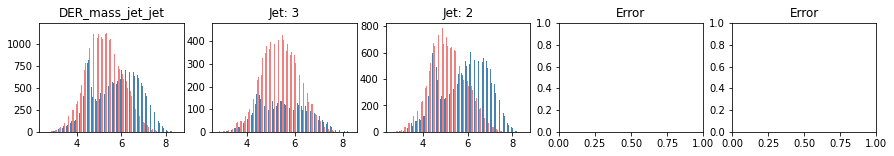

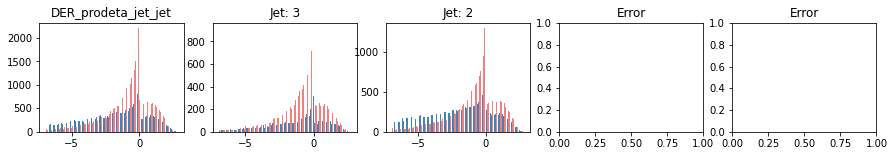

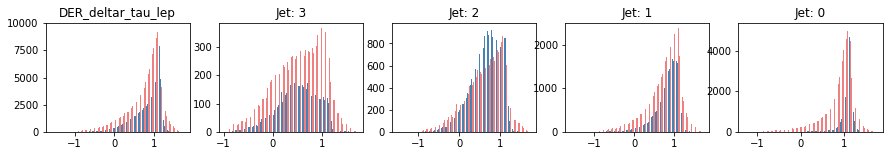

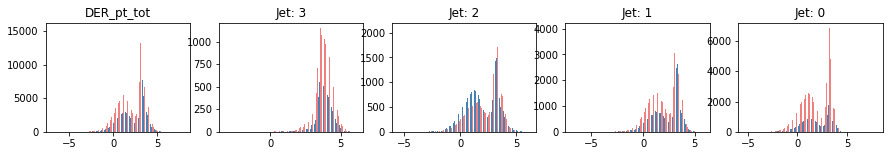

...

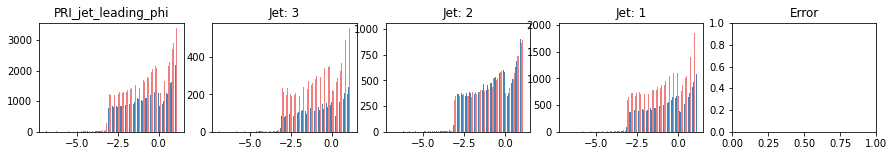

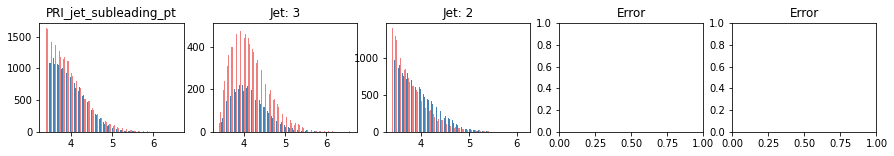

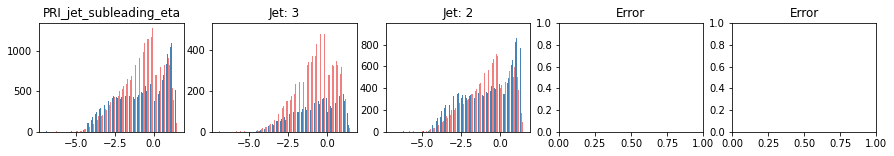

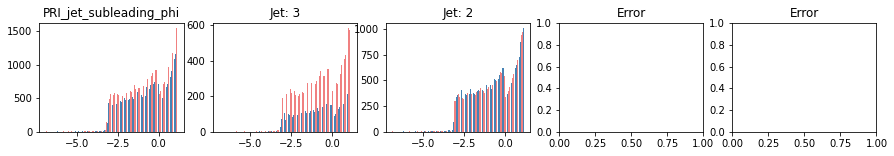

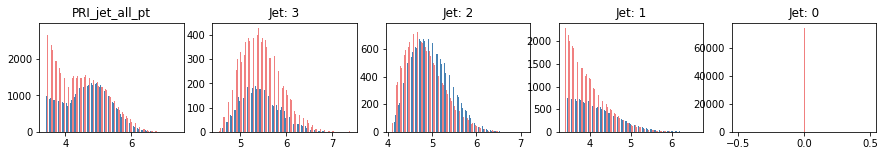

In [187]:
data_b = data2[data2["Prediction"]=='b']
data_s = data2[data2["Prediction"]=='s']

stack = False
colors = ['lightcoral', 'steelblue']

for col in headers[2:]:
    plt.figure(figsize=[15,2])
    
    plt.subplot(1,5,1)
    plt.hist([np.ma.log(data_b[col]), 
              np.ma.log(data_s[col])], bins=100, stacked=stack, color=colors, label=colors)
    plt.title(col)
    
    plt.subplot(1,5,2)
    plt.hist([np.ma.log(data_b[data_b["PRI_jet_num"] == 3][col]), 
              np.ma.log(data_s[data_s["PRI_jet_num"] == 3][col])], bins=100, stacked=stack, color=colors, label=colors)
    plt.title("Jet: 3")
    
    plt.subplot(1,5,3)
    plt.hist([np.ma.log(data_b[data_b["PRI_jet_num"] == 2][col]), 
              np.ma.log(data_s[data_s["PRI_jet_num"] == 2][col])], bins=100, stacked=stack, color=colors, label=colors)
    plt.title("Jet: 2")
    
    try:
        plt.subplot(1,5,4)
        plt.hist([np.ma.log(data_b[data_b["PRI_jet_num"] == 1][col]), 
                  np.ma.log(data_s[data_s["PRI_jet_num"] == 1][col])], bins=100, stacked=stack, color=colors, label=colors)
        plt.title("Jet: 1")
    except:
        plt.subplot(1,5,4)
        plt.title("Error")
        #continue
    
    try:
        plt.subplot(1,5,5)
        plt.hist([np.ma.log(data_b[data_b["PRI_jet_num"] == 0][col]), 
                  np.ma.log(data_s[data_s["PRI_jet_num"] == 0][col])], bins=100, stacked=stack, color=colors, label=colors)
        plt.title("Jet: 0")
    except:
        plt.subplot(1,5,5)
        plt.title("Error")
        #continue
    
    plt.show()

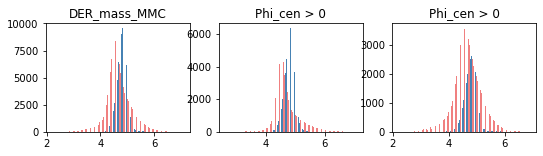

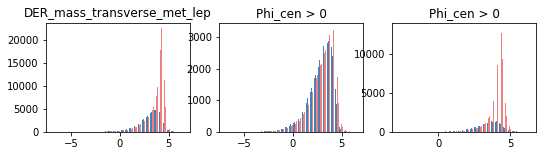

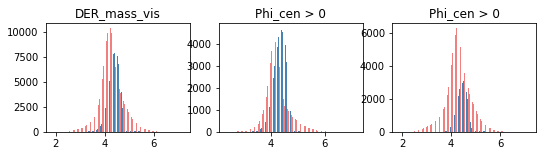

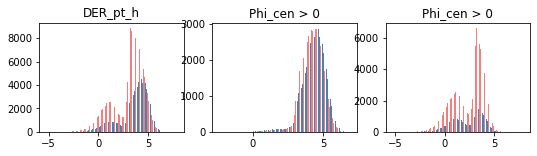

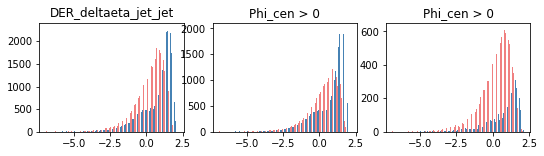

...

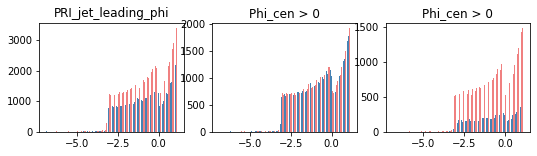

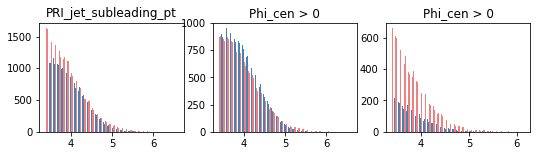

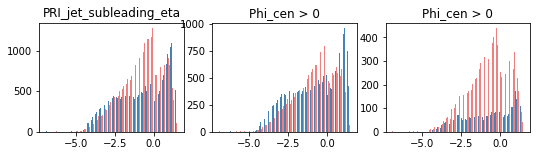

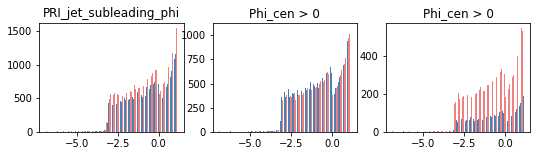

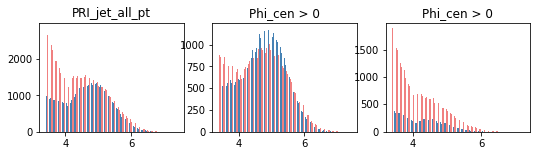

In [188]:
data_b = data2[data2["Prediction"]=='b']
data_s = data2[data2["Prediction"]=='s']

stack = False
colors = ['lightcoral', 'steelblue']

for col in headers[2:]:
    plt.figure(figsize=[15,2])
    
    plt.subplot(1,5,1)
    plt.hist([np.ma.log(data_b[col]), 
              np.ma.log(data_s[col])], bins=100, stacked=stack, color=colors, label=colors)
    plt.title(col)
    
    plt.subplot(1,5,2)
    plt.hist([np.ma.log(data_b[data_b["DER_met_phi_centrality"] > 0][col]), 
              np.ma.log(data_s[data_s["DER_met_phi_centrality"] > 0][col])], bins=100, stacked=stack, color=colors, label=colors)
    plt.title("Phi_cen > 0")
    
    plt.subplot(1,5,3)
    plt.hist([np.ma.log(data_b[data_b["DER_met_phi_centrality"] < 0][col]), 
              np.ma.log(data_s[data_s["DER_met_phi_centrality"] < 0][col])], bins=100, stacked=stack, color=colors, label=colors)
    plt.title("Phi_cen > 0")
    
    plt.show()

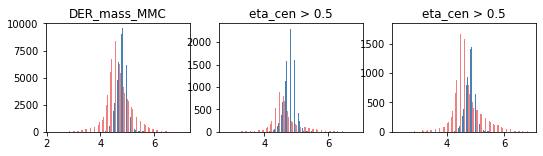

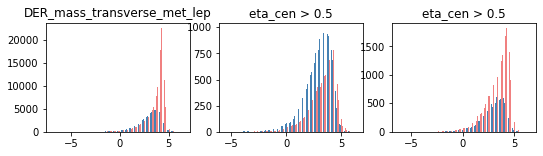

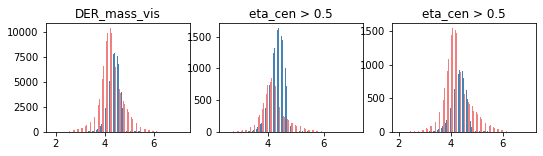

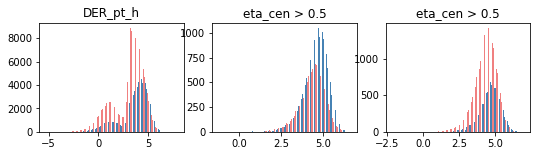

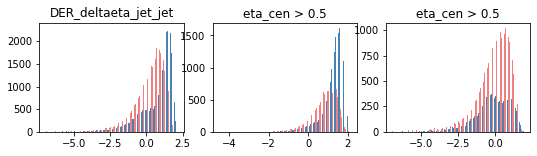

...

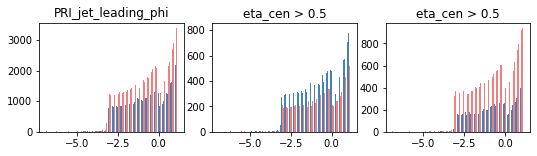

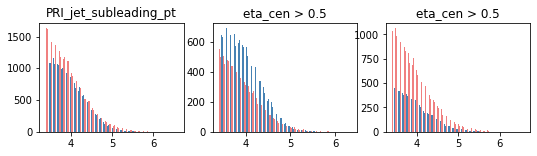

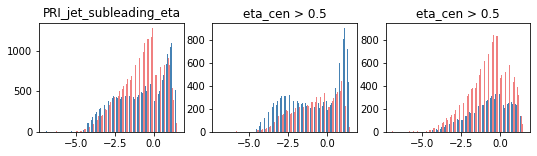

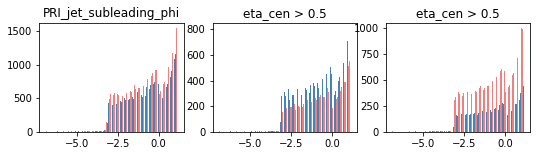

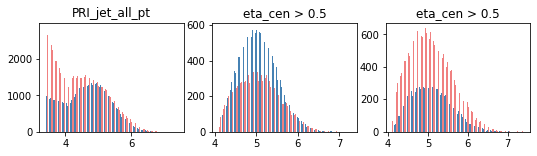

In [190]:
data_b = data2[data2["Prediction"]=='b']
data_s = data2[data2["Prediction"]=='s']

stack = False
colors = ['lightcoral', 'steelblue']

for col in headers[2:]:
    plt.figure(figsize=[15,2])
    
    plt.subplot(1,5,1)
    plt.hist([np.ma.log(data_b[col]), 
              np.ma.log(data_s[col])], bins=100, stacked=stack, color=colors, label=colors)
    plt.title(col)
    
    plt.subplot(1,5,2)
    plt.hist([np.ma.log(data_b[data_b["DER_lep_eta_centrality"] > 0.5][col]), 
              np.ma.log(data_s[data_s["DER_lep_eta_centrality"] > 0.5][col])], bins=100, stacked=stack, color=colors, label=colors)
    plt.title("eta_cen > 0.5")
    
    plt.subplot(1,5,3)
    plt.hist([np.ma.log(data_b[data_b["DER_lep_eta_centrality"] < 0.5][col]), 
              np.ma.log(data_s[data_s["DER_lep_eta_centrality"] < 0.5][col])], bins=100, stacked=stack, color=colors, label=colors)
    plt.title("eta_cen > 0.5")
    
    plt.show()

## Dividing datasets by values

In [192]:
data2

def divide_data(data_in, headers = [], thresh = []):


array([(100000, 's', 138.47 ,  51.655,  97.827, 27.98 , 0.91, 124.711, 2.666, 3.064, 41.928, 197.76 , 1.582,  1.396, 0.2, 32.638,  1.017,  0.381,  51.626,  2.273, -2.414, 16.824, -0.277, 258.733, 2, 67.435, 2.15 ,  0.444, 46.062, 1.24, -2.475, 113.497),
       (100001, 'b', 160.937,  68.768, 103.235, 48.146,  nan,     nan,   nan, 3.473,  2.078, 125.157, 0.879,  1.414, nan, 42.014,  2.039, -3.011,  36.918,  0.501,  0.103, 44.704, -1.916, 164.546, 1, 46.226, 0.725,  1.158,    nan,  nan,    nan,  46.226),
       (100002, 'b',     nan, 162.172, 125.953, 35.635,  nan,     nan,   nan, 3.148,  9.336, 197.814, 3.776,  1.414, nan, 32.154, -0.705, -2.093, 121.409, -0.953,  1.052, 54.283, -2.186, 260.414, 1, 44.251, 2.053, -2.028,    nan,  nan,    nan,  44.251),
       ...,
       (349997, 's', 105.457,  60.526,  75.839, 39.757,  nan,     nan,   nan, 2.39 , 22.183, 120.462, 1.202,  0.529, nan, 35.636, -0.266, -3.132,  42.834,  0.381,  0.851, 23.419, -2.89 , 198.907, 1, 41.992, 1.8  , -0.166,    n

In [194]:
h1t1 = data2["PRI_jet_all_pt"]>2
h1t2 = data2["PRI_jet_all_pt"]<2


array([ True,  True,  True, ...,  True, False, False])

In [247]:
headers = ["PRI_jet_num", 
           "DER_met_phi_centrality",
           "DER_lep_eta_centrality"]
thresholds = [[0.5,1.5,2.5],
              [0],
              [0.5]]

out = np.zeros((3,6), dtype=np.ndarray)
for i in range(len(headers)):
    head = headers[i]
    threshs = thresholds[i]
    
    for it in range(len(threshs)):
        
        th = threshs[it]
        out[i][int(2*it)] = data[head]<th
        out[i][int(2*it+1)] = data[head]>th
        

In [551]:
split_d = {}

split_d["PRI_jet_num"] = ["J0",
                          "J1",
                          "J2",
                          "J3"]

split_d["DER_met_phi_centrality"] = ["p+",
                                     "p-"]

split_d["DER_lep_eta_centrality"] = ["e+",
                                     "e-"] 

# Expand jet_num to include combinations
comb = list(itertools.combinations(split_d["PRI_jet_num"],1)) 
comb = list(itertools.combinations(split_d["PRI_jet_num"],2)) + comb
comb = list(itertools.combinations(split_d["PRI_jet_num"],3)) + comb
split_d["PRI_jet_num"] = comb

comb = split_d["PRI_jet_num"] + split_d["DER_met_phi_centrality"] + split_d["DER_lep_eta_centrality"]

# Prepare combinations of 2 sets of features
comb2 = list(itertools.product(*list(split_d.values())[0:2]))
comb2 = list(itertools.product(*list(split_d.values())[1:3])) + comb2
comb2 = list(itertools.product(*[list(split_d.values())[0],list(split_d.values())[-1]])) + comb2

# Prepare combinations of 3 sets of features
comb3 = list(itertools.product(*list(split_d.values())[0:3]))

combination_names = comb+comb2+comb3

In [578]:
# Select which header to split and how
split_d = {}

split_d["PRI_jet_num"] = [data2["PRI_jet_num"] == 0,
                          data2["PRI_jet_num"] == 1,
                          data2["PRI_jet_num"] == 2,
                          data2["PRI_jet_num"] == 3]

split_d["DER_met_phi_centrality"] = [data2["DER_met_phi_centrality"] > 0,
                                     data2["DER_met_phi_centrality"] < 0]

split_d["DER_lep_eta_centrality"] = [data2["DER_lep_eta_centrality"] > 0.5,
                                     data2["DER_lep_eta_centrality"] < 0.5]   


# Expand jet_num to include combinations
comb = list(itertools.combinations(split_d["PRI_jet_num"],1)) 
comb = list(itertools.combinations(split_d["PRI_jet_num"],2)) + comb
comb = list(itertools.combinations(split_d["PRI_jet_num"],3)) + comb
comb = [np.logical_or.reduce(tup) for tup in comb]
split_d["PRI_jet_num"] =  comb

# Combinations of 1 set of features
comb = split_d["PRI_jet_num"] + split_d["DER_met_phi_centrality"] + split_d["DER_lep_eta_centrality"]

# Combinations of 2 sets of features
comb2 = list(itertools.product(*list(split_d.values())[0:2]))
comb2 = list(itertools.product(*list(split_d.values())[1:3])) + comb2
comb2 = list(itertools.product(*[list(split_d.values())[0],list(split_d.values())[-1]])) + comb2
comb2 = [np.logical_or.reduce(tup) for tup in comb2]

# Combinations of 3 sets of features
comb3 = list(itertools.product(*list(split_d.values())[0:3]))
comb3 = [np.logical_or.reduce(tup) for tup in comb3]

# All outputs
combinations = comb+comb2+comb3

In [585]:
data2[combinations[0]]

array([(100000, 's', 138.47 ,  51.655,  97.827, 27.98 , 0.91, 124.711, 2.666, 3.064, 41.928, 197.76 , 1.582,  1.396, 0.2, 32.638,  1.017,  0.381,  51.626,  2.273, -2.414, 16.824, -0.277, 258.733, 2, 67.435, 2.15 ,  0.444, 46.062, 1.24, -2.475, 113.497),
       (100001, 'b', 160.937,  68.768, 103.235, 48.146,  nan,     nan,   nan, 3.473,  2.078, 125.157, 0.879,  1.414, nan, 42.014,  2.039, -3.011,  36.918,  0.501,  0.103, 44.704, -1.916, 164.546, 1, 46.226, 0.725,  1.158,    nan,  nan,    nan,  46.226),
       (100002, 'b',     nan, 162.172, 125.953, 35.635,  nan,     nan,   nan, 3.148,  9.336, 197.814, 3.776,  1.414, nan, 32.154, -0.705, -2.093, 121.409, -0.953,  1.052, 54.283, -2.186, 260.414, 1, 44.251, 2.053, -2.028,    nan,  nan,    nan,  44.251),
       ...,
       (349997, 's', 105.457,  60.526,  75.839, 39.757,  nan,     nan,   nan, 2.39 , 22.183, 120.462, 1.202,  0.529, nan, 35.636, -0.266, -3.132,  42.834,  0.381,  0.851, 23.419, -2.89 , 198.907, 1, 41.992, 1.8  , -0.166,    n

In [507]:
comb2 = list(itertools.product(*list(split_d.values())[0:2]))
comb2 = list(itertools.product(*list(split_d.values())[1:3])) + comb2
comb2 = list(itertools.product(*[list(split_d.values())[0],list(split_d.values())[-1]])) + comb2
comb2

[(array([ True,  True,  True, ...,  True,  True,  True]),
  array([False, False, False, ..., False, False, False])),
 (array([ True,  True,  True, ...,  True,  True,  True]),
  array([ True, False, False, ..., False, False, False])),
 (array([False,  True,  True, ...,  True,  True,  True]),
  array([False, False, False, ..., False, False, False])),
 (array([False,  True,  True, ...,  True,  True,  True]),
  array([ True, False, False, ..., False, False, False])),
 (array([ True, False, False, ..., False,  True,  True]),
  array([False, False, False, ..., False, False, False])),
 (array([ True, False, False, ..., False,  True,  True]),
  array([ True, False, False, ..., False, False, False])),
 (array([ True,  True,  True, ...,  True, False, False]),
  array([False, False, False, ..., False, False, False])),
 (array([ True,  True,  True, ...,  True, False, False]),
  array([ True, False, False, ..., False, False, False])),
 (array([False,  True,  True, ...,  True,  True,  True]),
  arra

In [ ]:
comb

In [394]:
list(itertools.product(*list(split_d.values())[0:2]))

[('A', 'a1'),
 ('A', 'b1'),
 ('B', 'a1'),
 ('B', 'b1'),
 ('C', 'a1'),
 ('C', 'b1'),
 ('D', 'a1'),
 ('D', 'b1')]

In [396]:

list(itertools.product(*list(split_d.values()), repeat=2))

[('A', 'a1', 'a2', 'A', 'a1', 'a2'),
 ('A', 'a1', 'a2', 'A', 'a1', 'b2'),
 ('A', 'a1', 'a2', 'A', 'b1', 'a2'),
 ('A', 'a1', 'a2', 'A', 'b1', 'b2'),
 ('A', 'a1', 'a2', 'B', 'a1', 'a2'),
 ('A', 'a1', 'a2', 'B', 'a1', 'b2'),
 ('A', 'a1', 'a2', 'B', 'b1', 'a2'),
 ('A', 'a1', 'a2', 'B', 'b1', 'b2'),
 ('A', 'a1', 'a2', 'C', 'a1', 'a2'),
 ('A', 'a1', 'a2', 'C', 'a1', 'b2'),
 ('A', 'a1', 'a2', 'C', 'b1', 'a2'),
 ('A', 'a1', 'a2', 'C', 'b1', 'b2'),
 ('A', 'a1', 'a2', 'D', 'a1', 'a2'),
 ('A', 'a1', 'a2', 'D', 'a1', 'b2'),
 ('A', 'a1', 'a2', 'D', 'b1', 'a2'),
 ('A', 'a1', 'a2', 'D', 'b1', 'b2'),
 ('A', 'a1', 'b2', 'A', 'a1', 'a2'),
 ('A', 'a1', 'b2', 'A', 'a1', 'b2'),
 ('A', 'a1', 'b2', 'A', 'b1', 'a2'),
 ('A', 'a1', 'b2', 'A', 'b1', 'b2'),
 ('A', 'a1', 'b2', 'B', 'a1', 'a2'),
 ('A', 'a1', 'b2', 'B', 'a1', 'b2'),
 ('A', 'a1', 'b2', 'B', 'b1', 'a2'),
 ('A', 'a1', 'b2', 'B', 'b1', 'b2'),
 ('A', 'a1', 'b2', 'C', 'a1', 'a2'),
 ('A', 'a1', 'b2', 'C', 'a1', 'b2'),
 ('A', 'a1', 'b2', 'C', 'b1', 'a2'),
 

In [195]:
h1t2 = data2["PRI_jet_all_pt"]<2

data2[h1t2]

array([(100003, 'b', 143.905, 81.417,  80.943,  0.414, nan, nan, nan, 3.31 ,  0.414, 75.968, 2.354, -1.285, nan, 22.647, -1.655,  0.01 , 53.321, -0.522, -3.1  , 31.082,  0.06 ,  86.062, 0, nan, nan, nan, nan, nan, nan, 0.),
       (100004, 'b', 175.864, 16.915, 134.805, 16.405, nan, nan, nan, 3.891, 16.405, 57.983, 1.056, -1.385, nan, 28.209, -2.197, -2.231, 29.774,  0.798,  1.569,  2.723, -0.871,  53.131, 0, nan, nan, nan, nan, nan, nan, 0.),
       (100008, 'b', 105.594, 50.559, 100.989,  4.288, nan, nan, nan, 2.904,  4.288, 65.333, 0.675, -1.366, nan, 39.008,  2.433, -2.532, 26.325,  0.21 ,  1.884, 37.791,  0.024, 129.804, 0, nan, nan, nan, nan, nan, nan, 0.),
       ...,
       (349996, 'b',     nan, 58.179,  68.083, 22.439, nan, nan, nan, 2.585, 22.439, 50.618, 1.162, -1.345, nan, 23.416, -1.609,  2.776, 27.202,  0.308,  1.042, 46.737, -0.867,  80.408, 0, nan, nan, nan, nan, nan, nan, 0.),
       (349998, 'b',  94.951, 19.362,  68.812, 13.504, nan, nan, nan, 3.365, 13.504, 55.859,

DER_mass_MMC


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


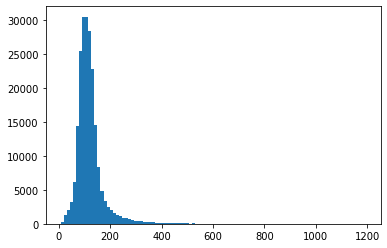

DER_mass_transverse_met_lep


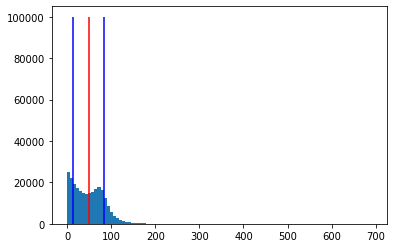

DER_mass_vis


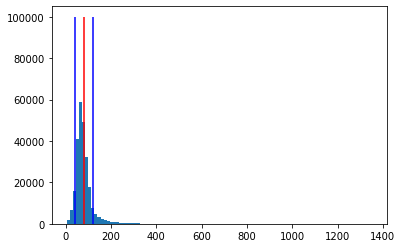

DER_pt_h


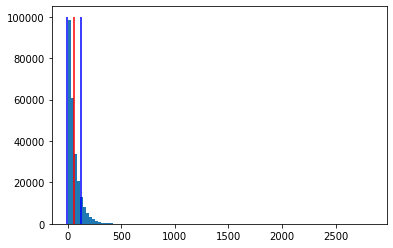

DER_deltaeta_jet_jet


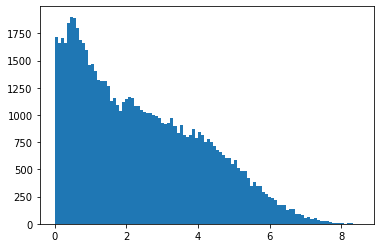

DER_mass_jet_jet


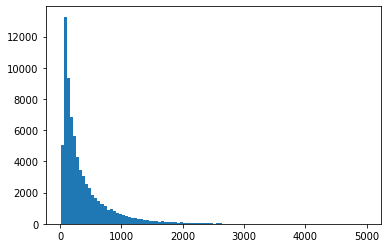

DER_prodeta_jet_jet


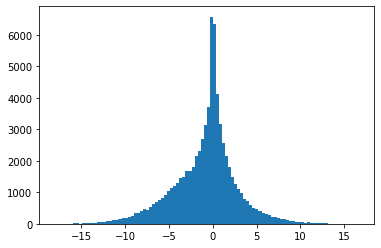

DER_deltar_tau_lep


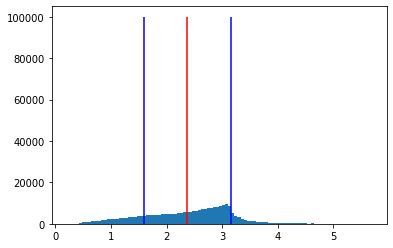

DER_pt_tot


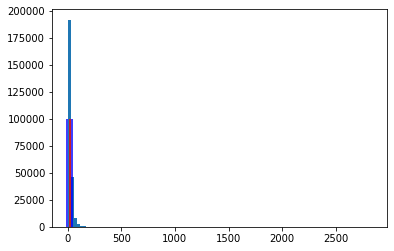

DER_sum_pt


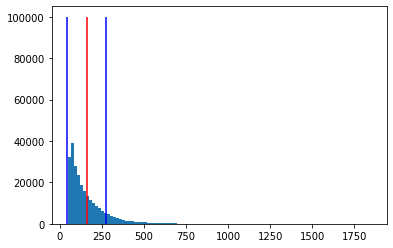

DER_pt_ratio_lep_tau


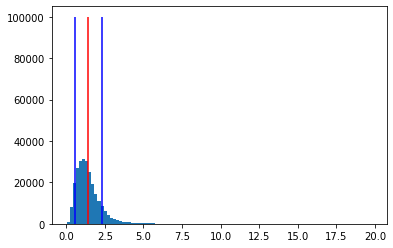

DER_met_phi_centrality


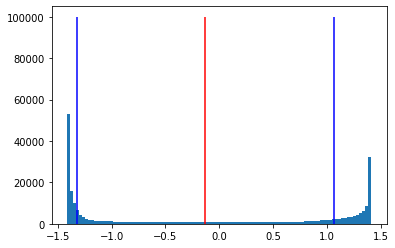

DER_lep_eta_centrality


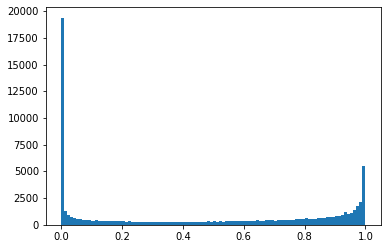

PRI_tau_pt


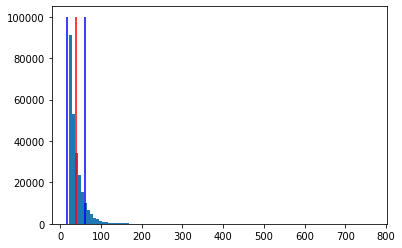

PRI_tau_eta


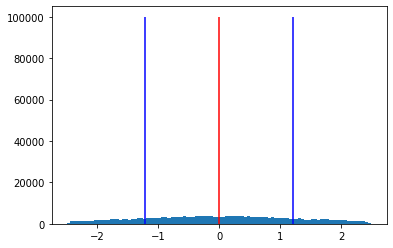

PRI_tau_phi


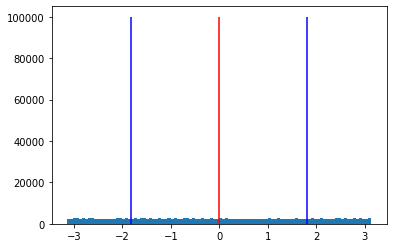

PRI_lep_pt


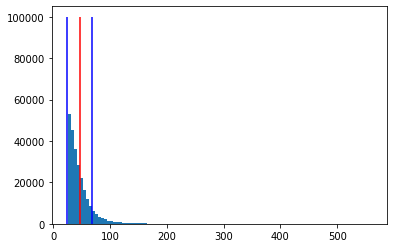

PRI_lep_eta


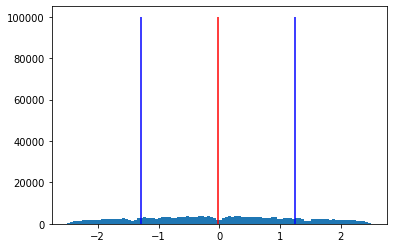

PRI_lep_phi


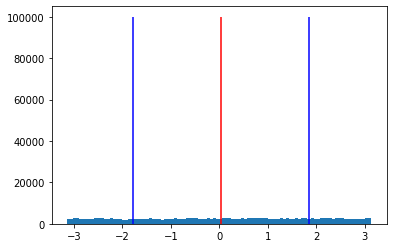

PRI_met


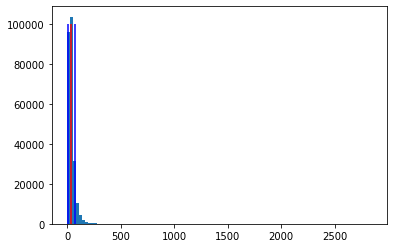

PRI_met_phi


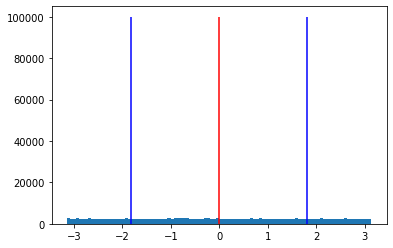

PRI_met_sumet


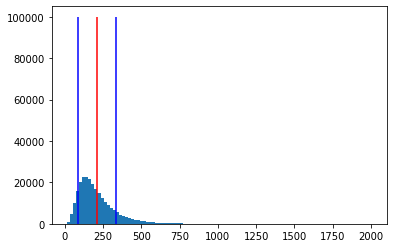

PRI_jet_num


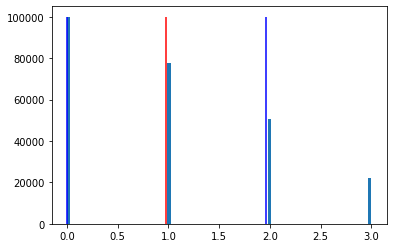

PRI_jet_leading_pt


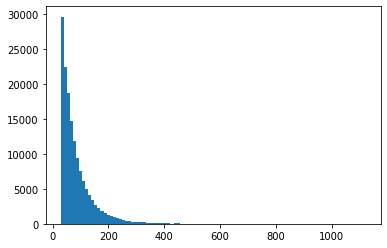

PRI_jet_leading_eta


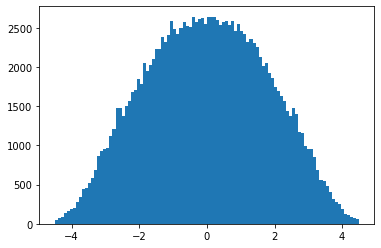

PRI_jet_leading_phi


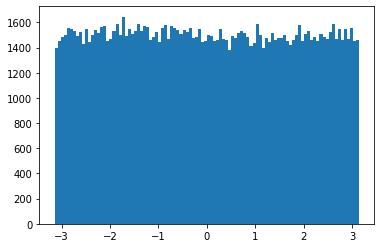

PRI_jet_subleading_pt


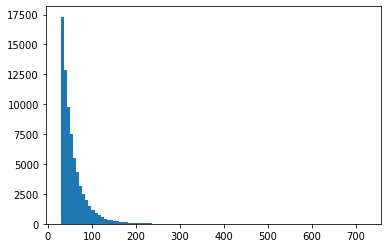

PRI_jet_subleading_eta


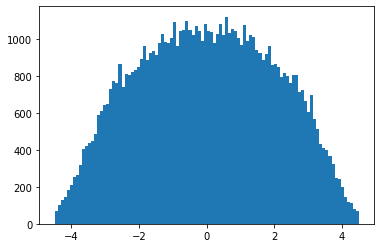

PRI_jet_subleading_phi


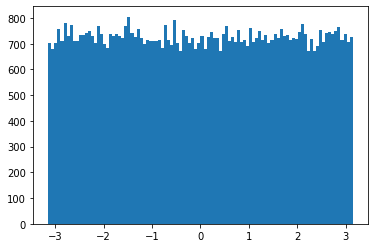

PRI_jet_all_pt


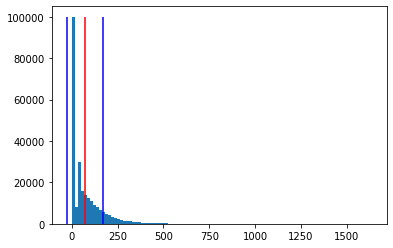

In [7]:
for col in headers[2:]:
    print(col)
    plt.hist(data2[col],bins=100)
    plt.vlines(data2[col].mean(),0,100000,"r")
    plt.vlines(data2[col].mean()+data2[col].std(),0,100000,"b")
    plt.vlines(data2[col].mean()-data2[col].std(),0,100000,"b")
    plt.show()

DER_mass_MMC


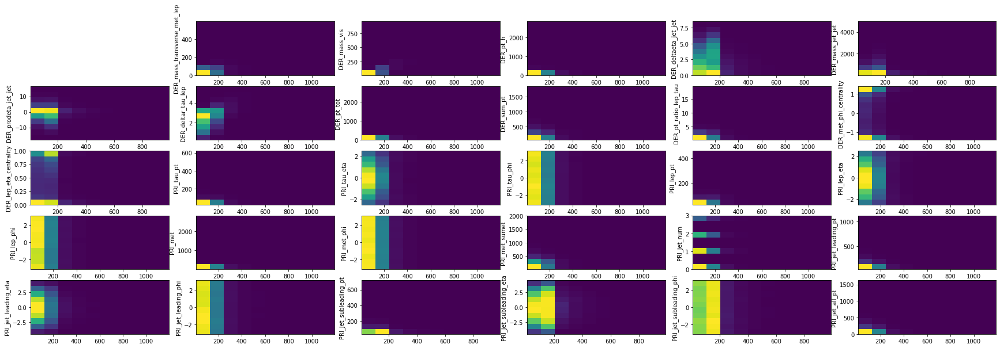

DER_mass_transverse_met_lep


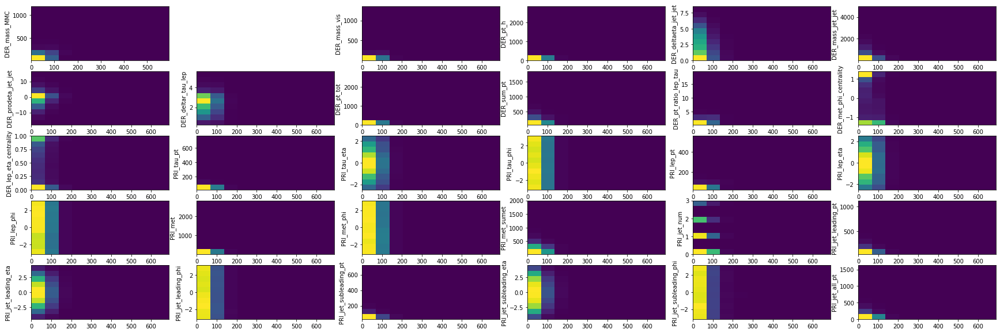

DER_mass_vis


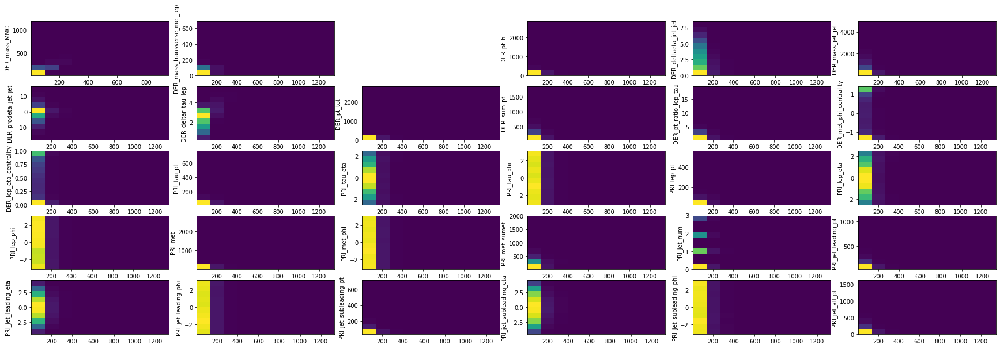

DER_pt_h


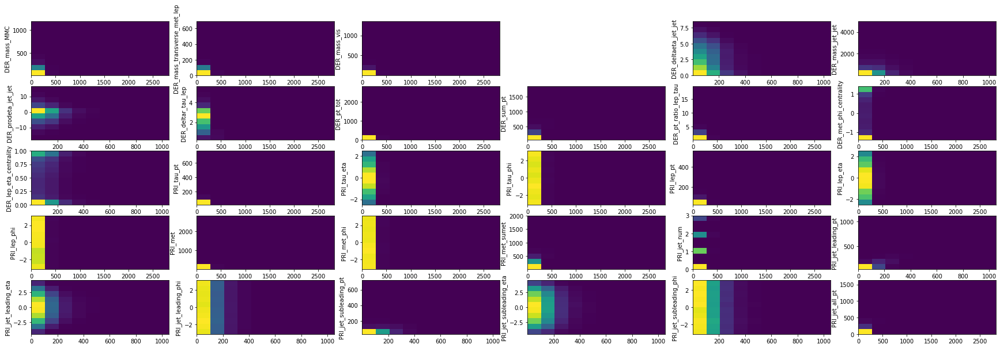

DER_deltaeta_jet_jet


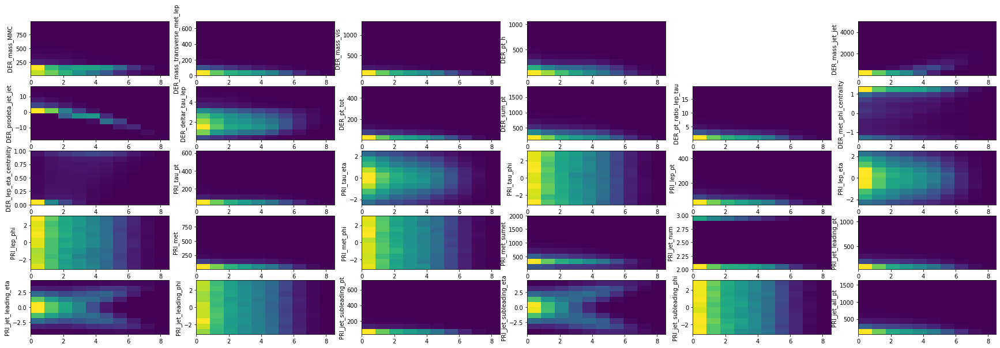

DER_mass_jet_jet


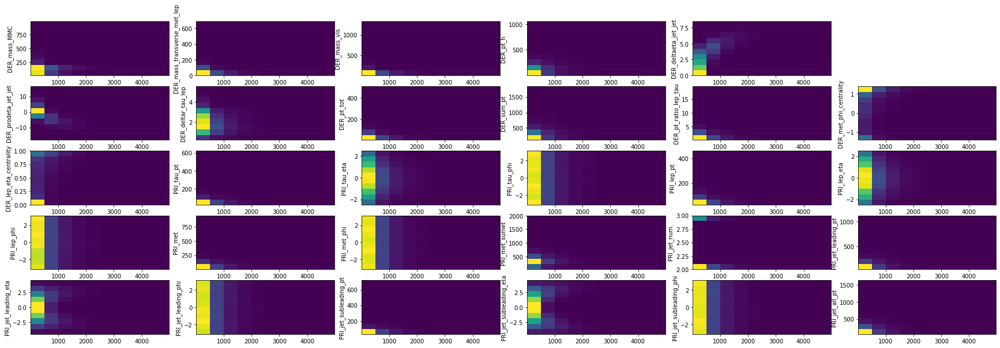

DER_prodeta_jet_jet


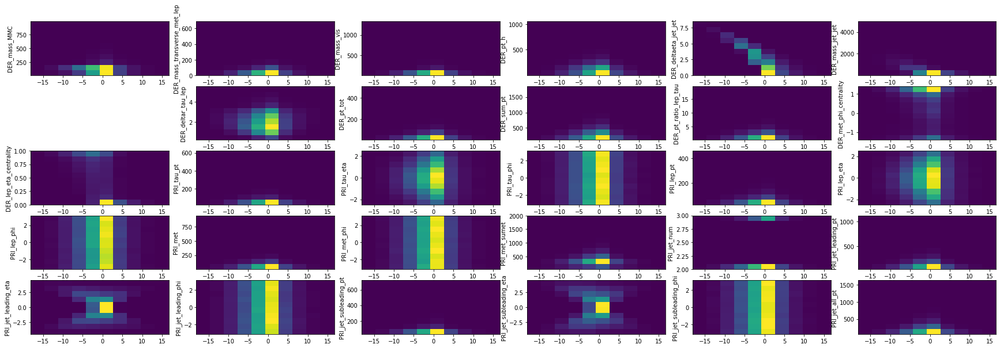

DER_deltar_tau_lep


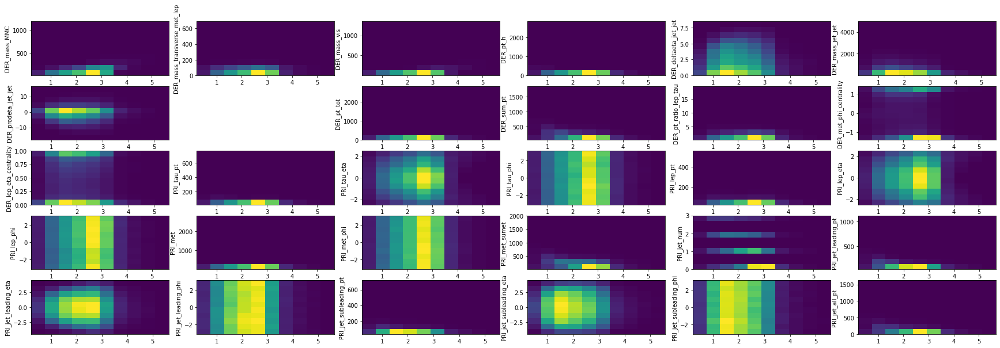

DER_pt_tot


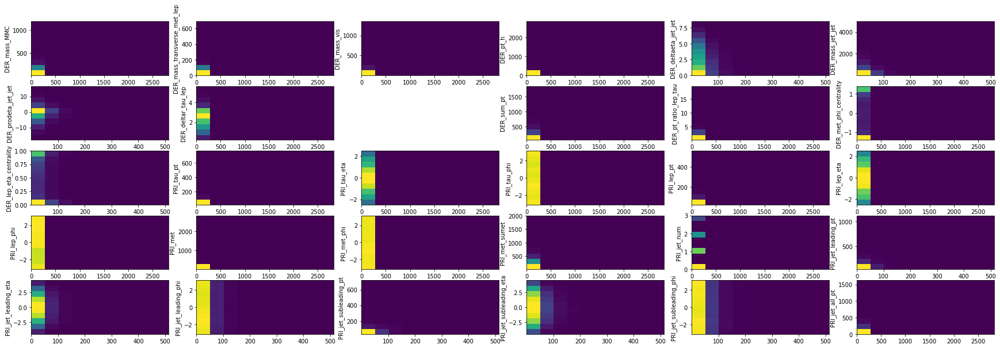

DER_sum_pt


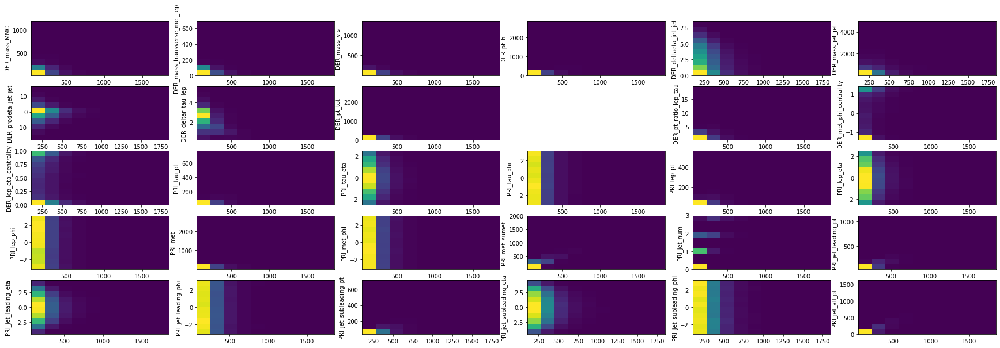

DER_pt_ratio_lep_tau


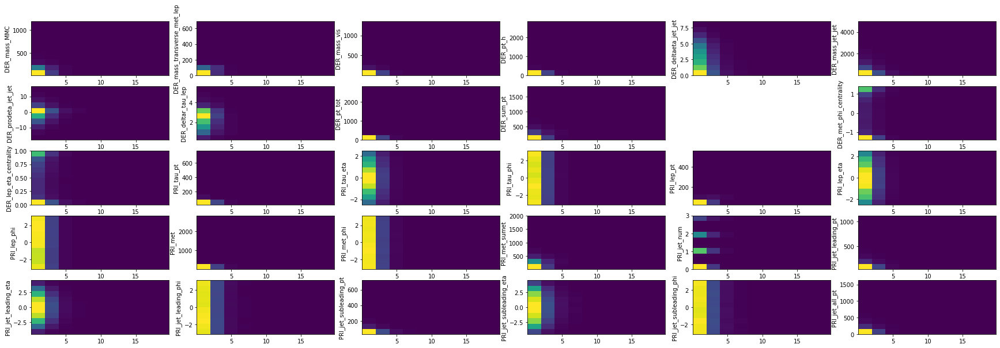

DER_met_phi_centrality


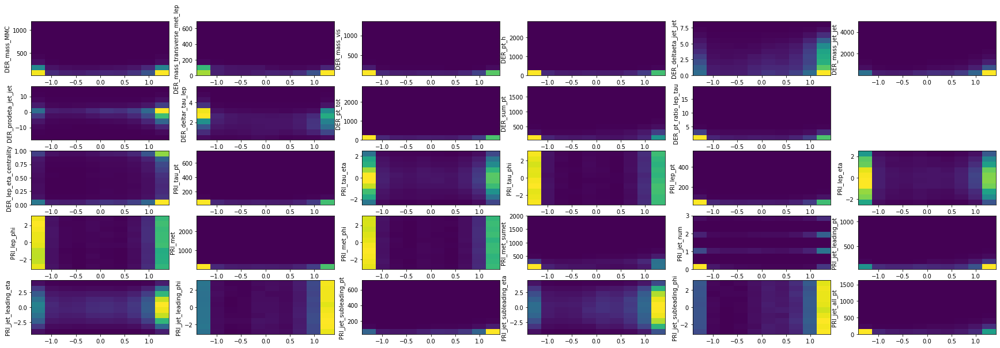

DER_lep_eta_centrality


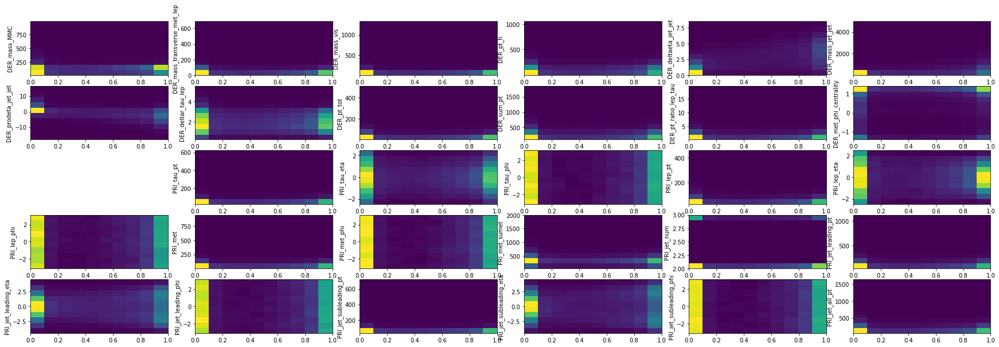

PRI_tau_pt


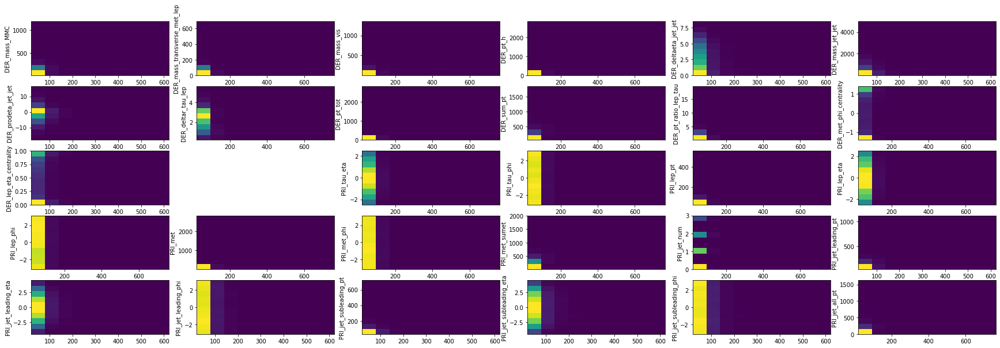

PRI_tau_eta


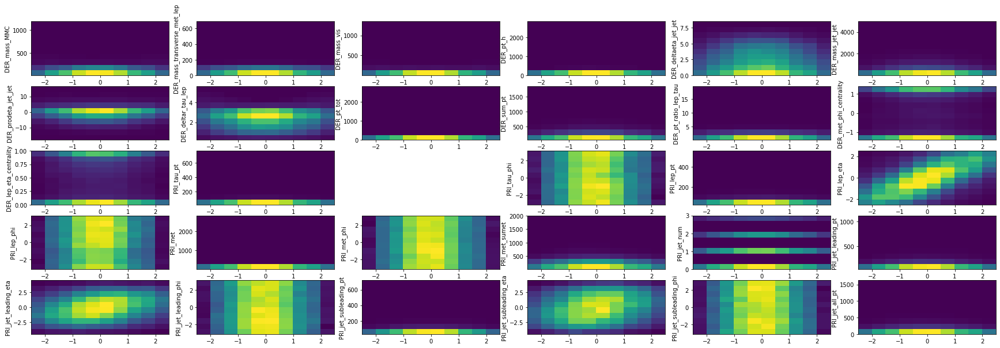

PRI_tau_phi


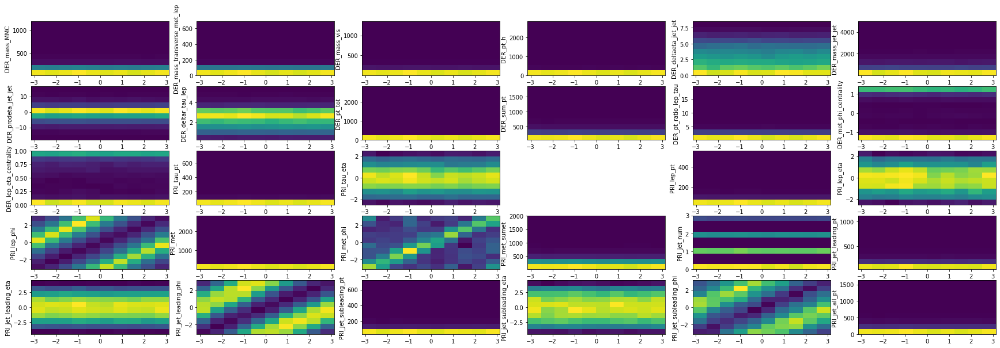

PRI_lep_pt


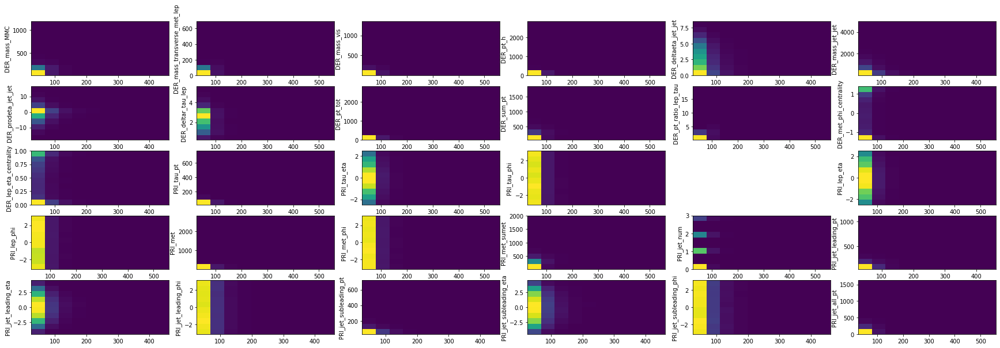

PRI_lep_eta


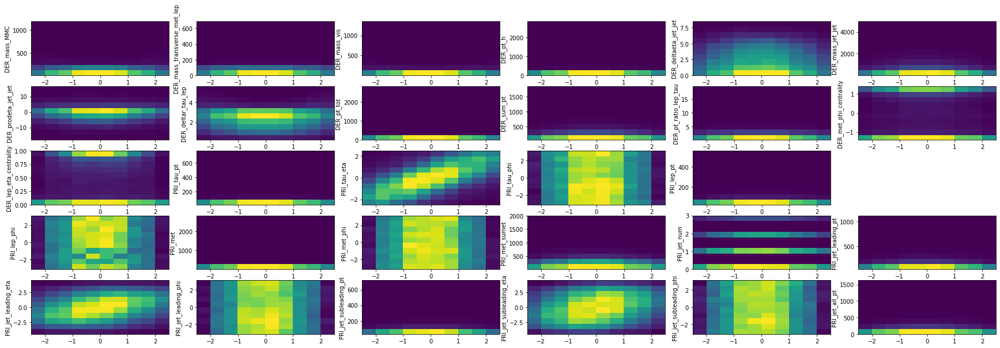

PRI_lep_phi


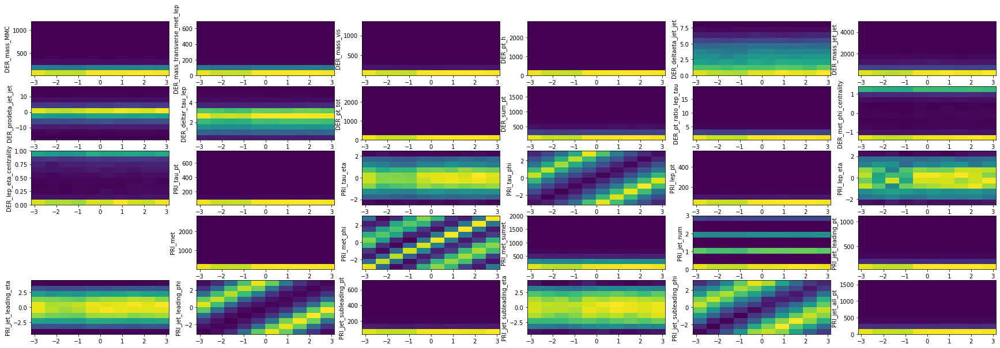

PRI_met


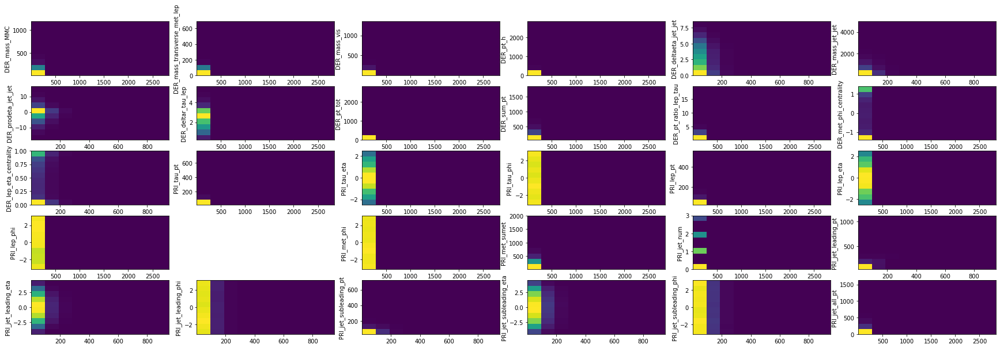

PRI_met_phi


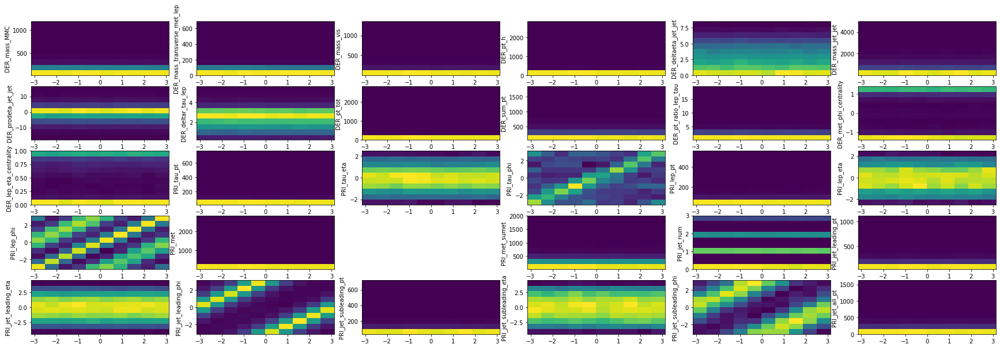

PRI_met_sumet


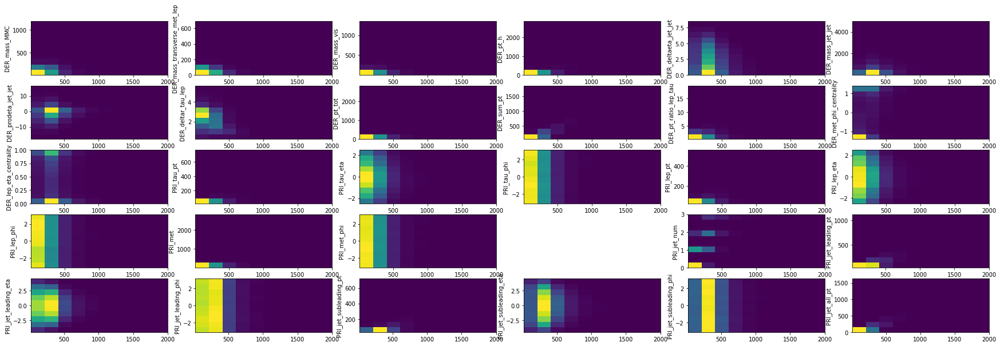

PRI_jet_num


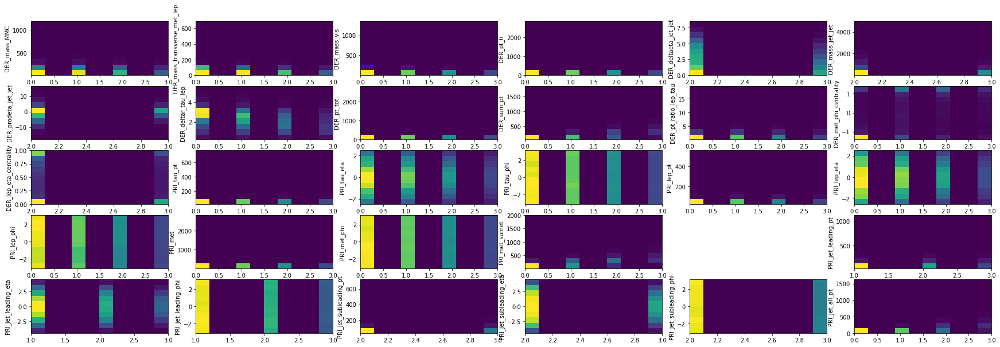

PRI_jet_leading_pt


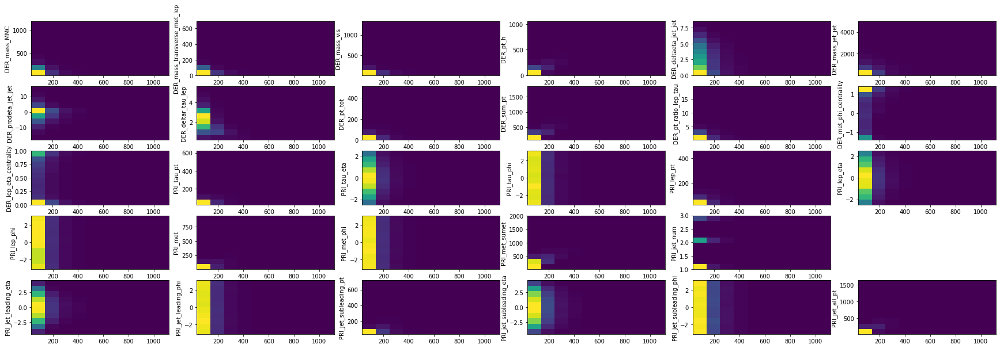

PRI_jet_leading_eta


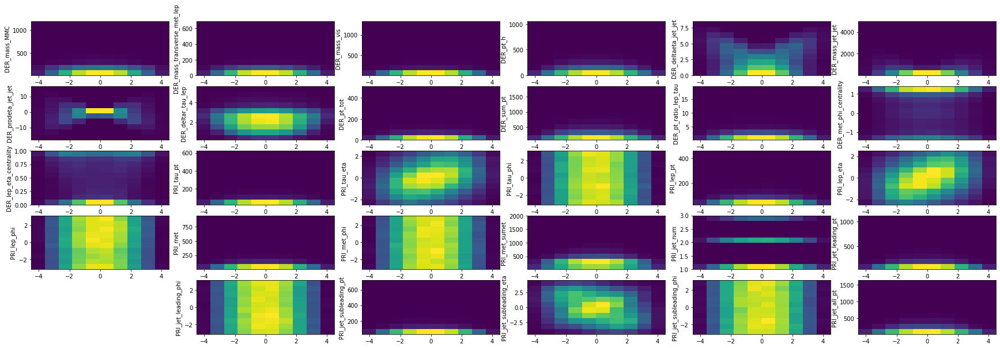

PRI_jet_leading_phi


KeyboardInterrupt: 

In [8]:
for i in range(30):
    col = headers[i+2]
    print(col)
    plt.figure(figsize=(30,10))
    for i in range(30):
        col2 = headers[i+2]
        if not col==col2:
            plt.subplot(5,6,i+1)
            #print(col,"\n",col2)
            select = np.logical_and(np.isfinite(data2[col]), np.isfinite(data2[col2]))
            plt.hist2d(data2[col][select], data2[col2][select])
            plt.ylabel(col2)
    plt.show()

In [29]:
data_b = data2[data2['Prediction']=="b"]
data_s = data2[data2['Prediction']=="s"]

DER_mass_MMC


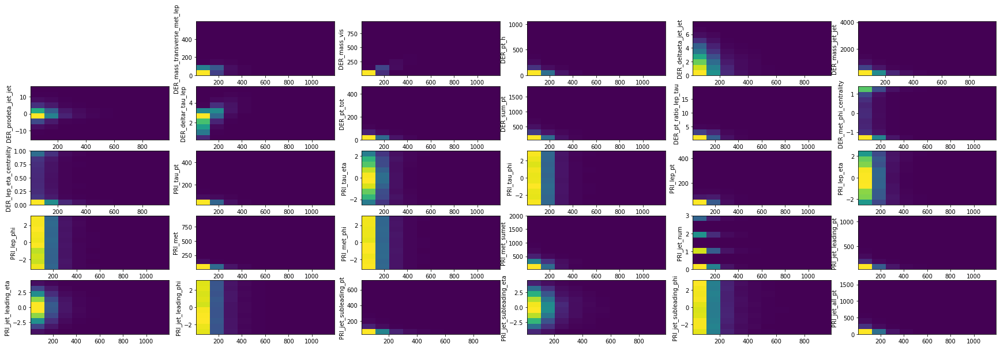

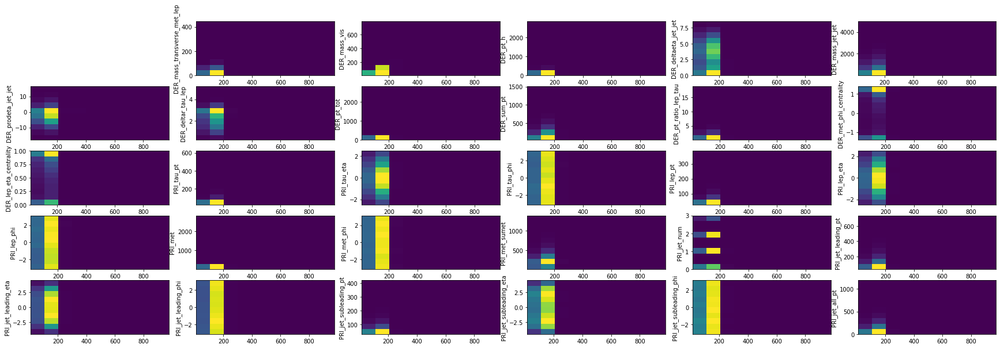

#########################
DER_mass_transverse_met_lep


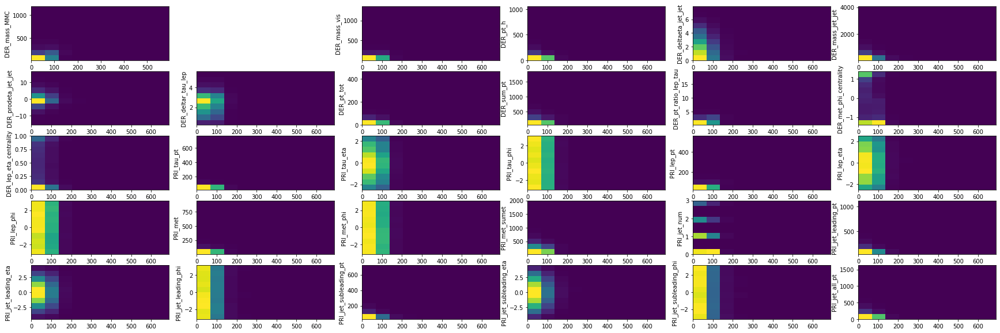

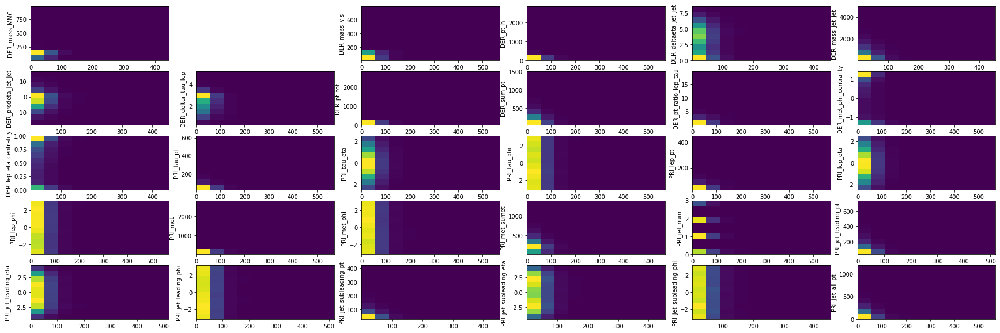

#########################
DER_mass_vis


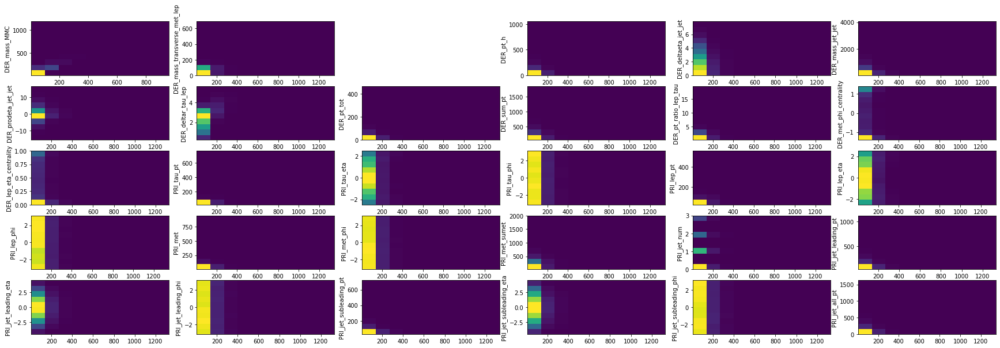

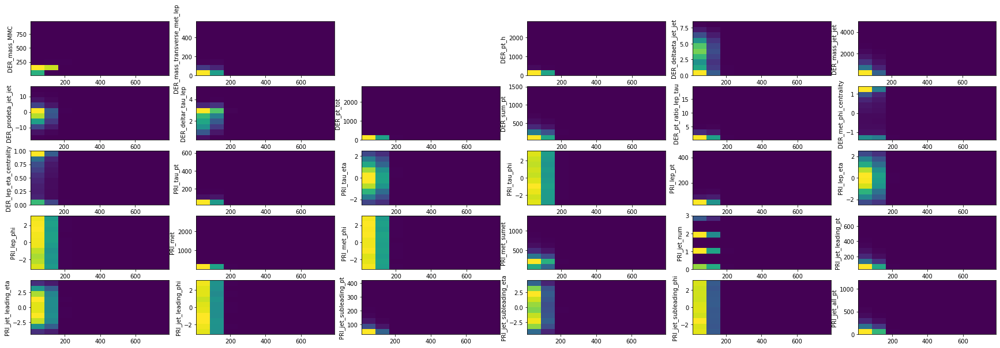

#########################
DER_pt_h


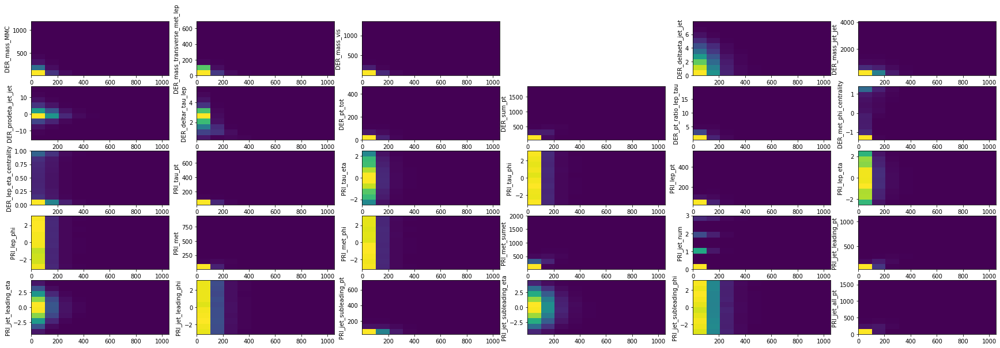

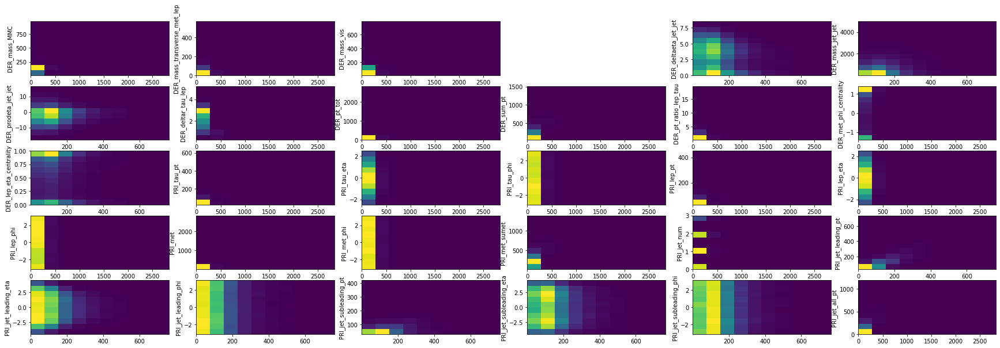

#########################
DER_deltaeta_jet_jet


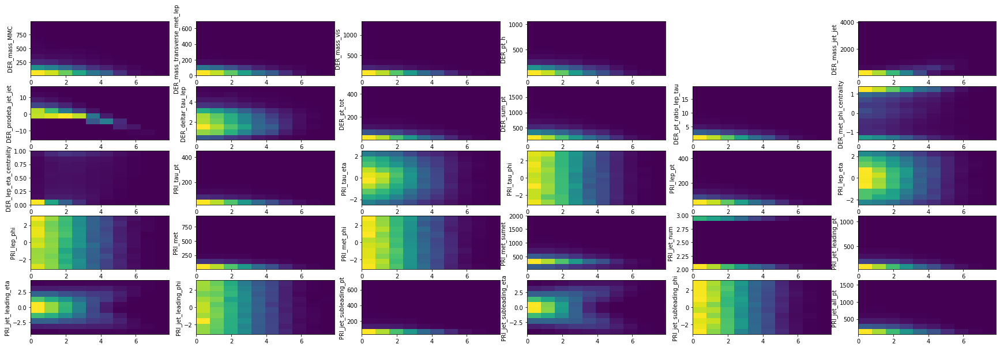

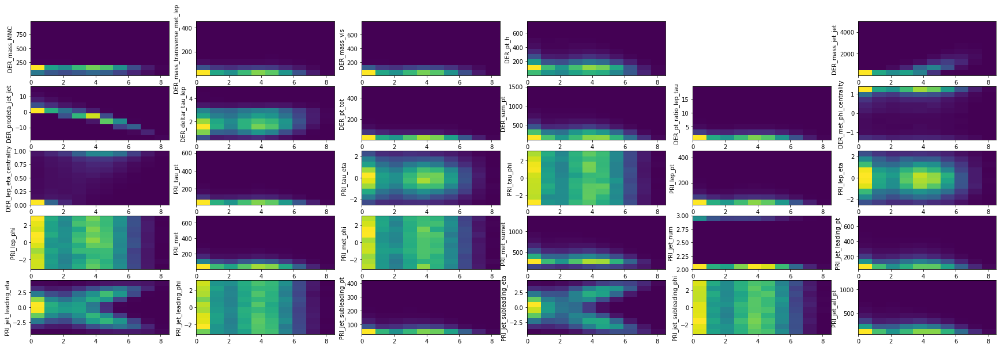

#########################
DER_mass_jet_jet


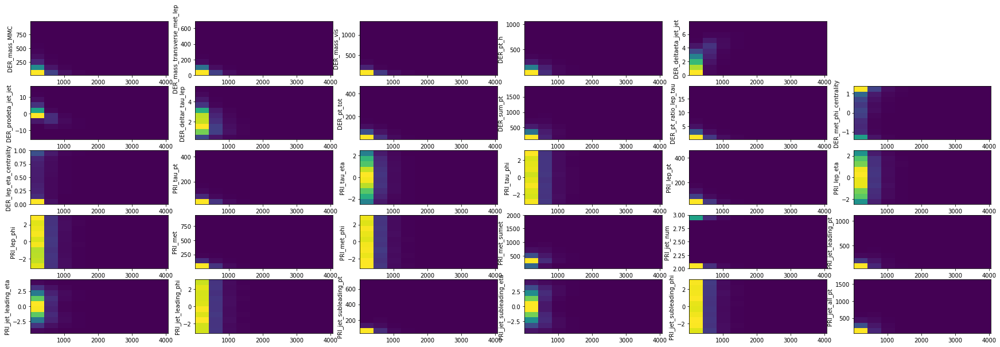

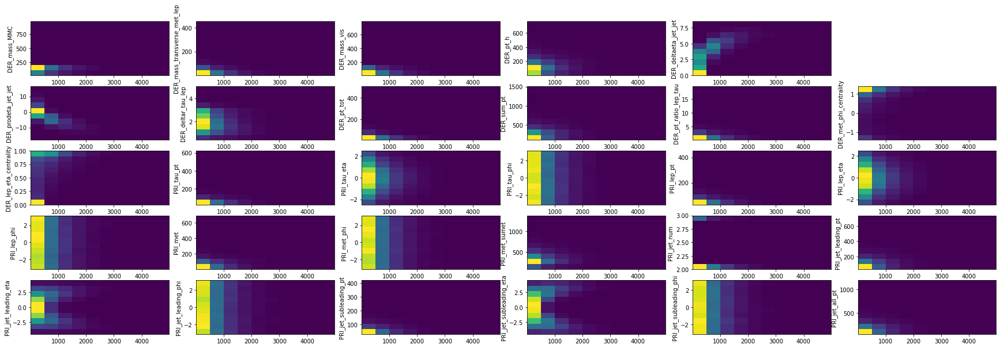

#########################
DER_prodeta_jet_jet


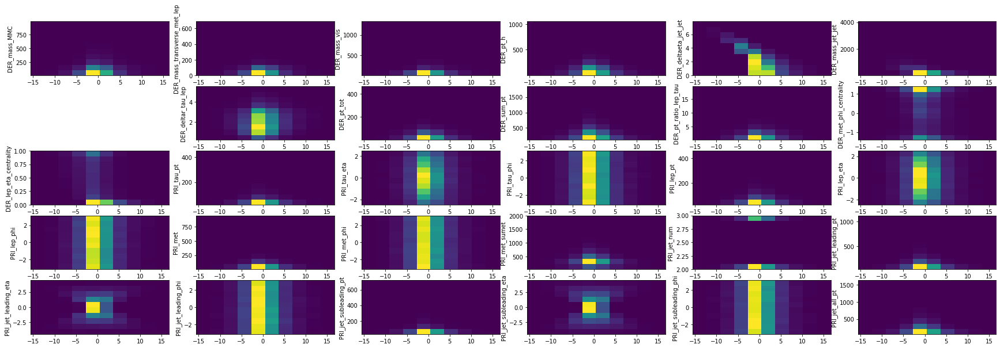

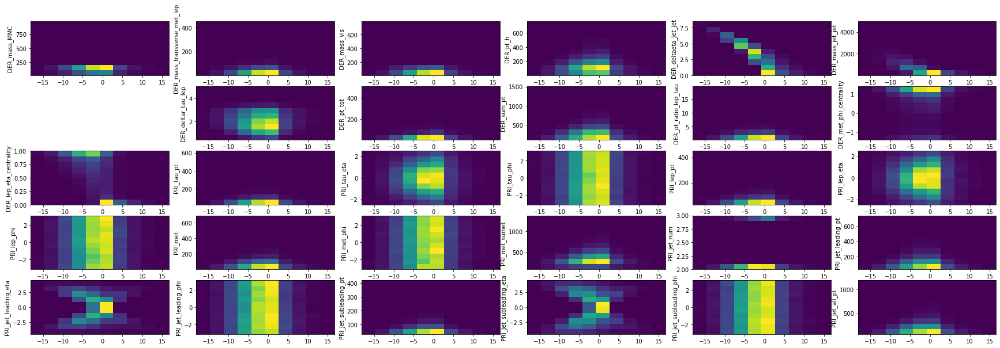

#########################
DER_deltar_tau_lep


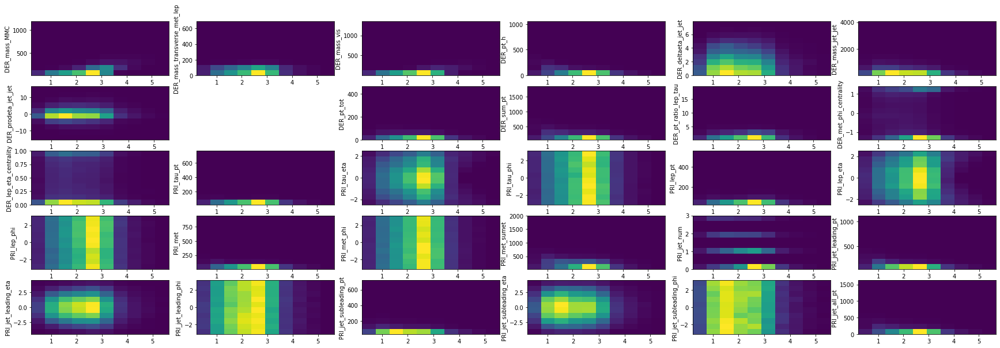

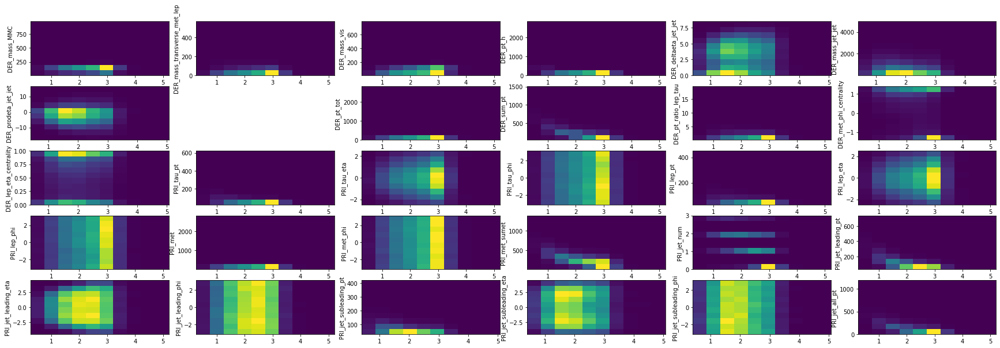

#########################
DER_pt_tot


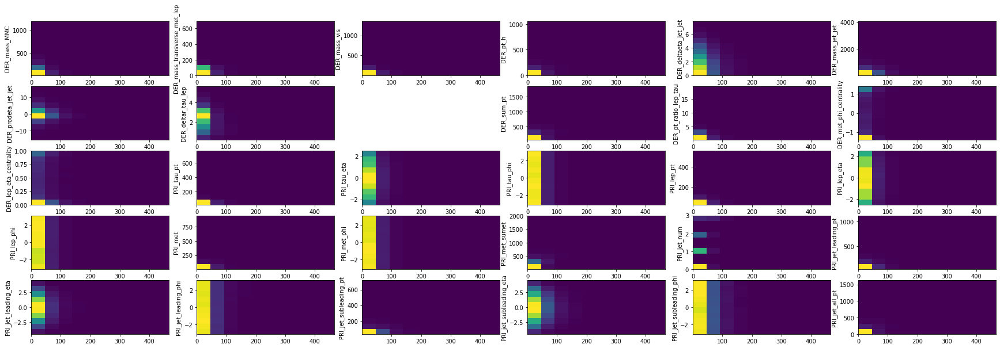

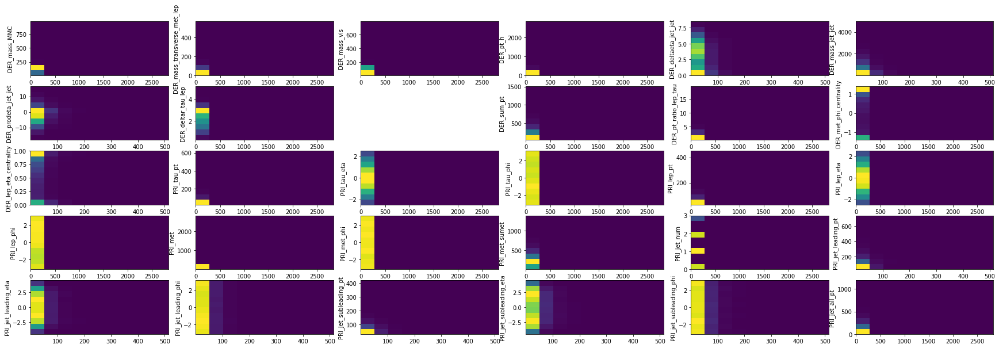

#########################
DER_sum_pt


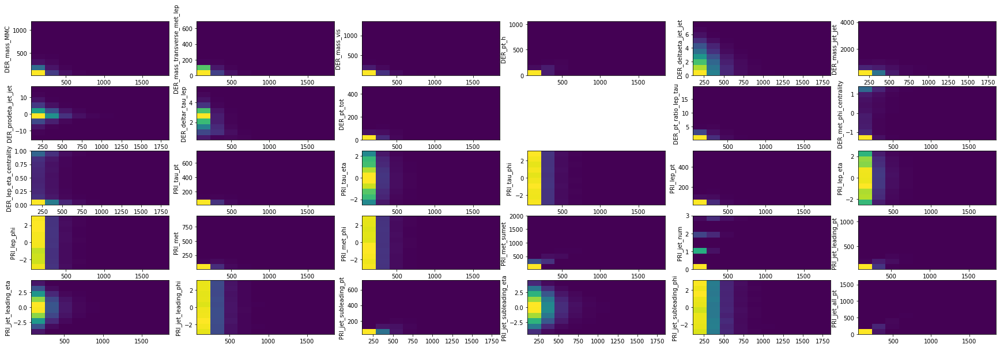

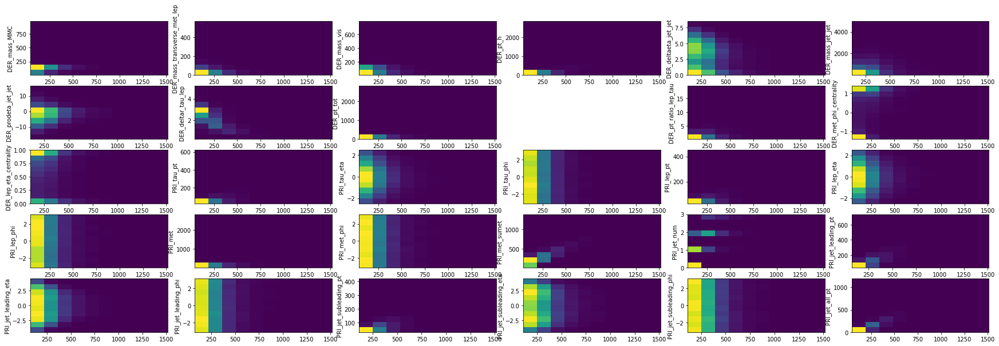

#########################
DER_pt_ratio_lep_tau


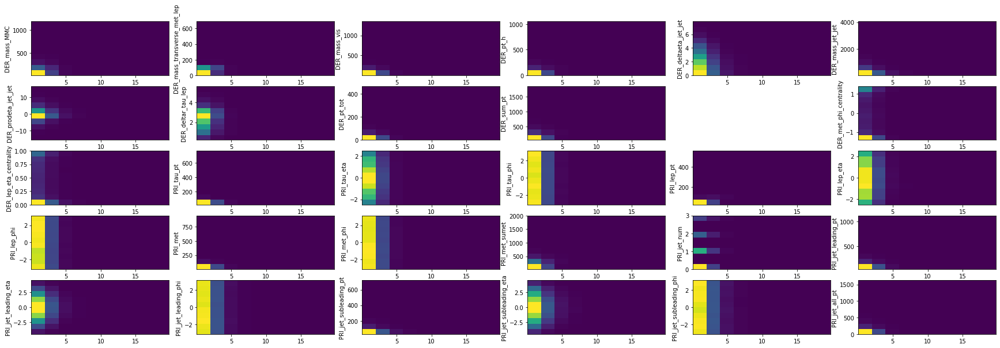

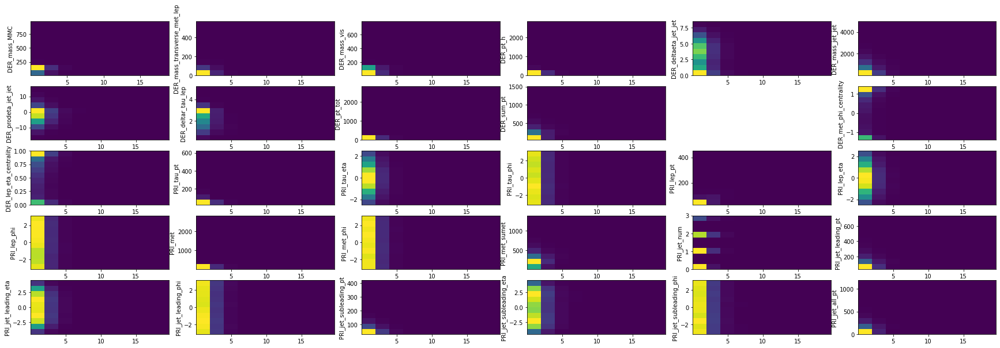

#########################
DER_met_phi_centrality


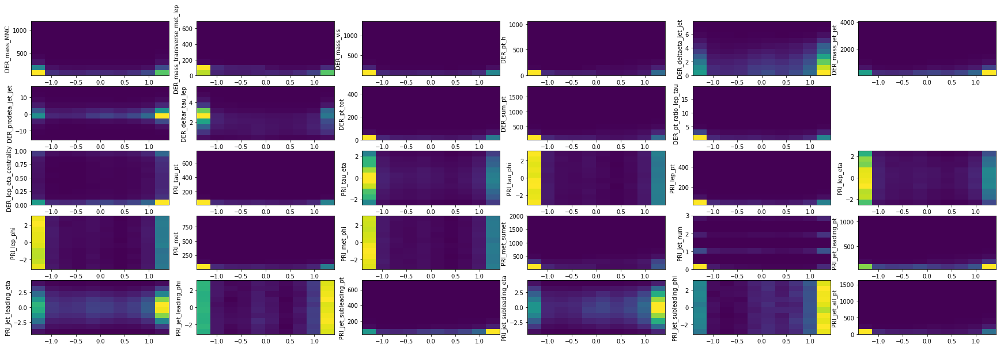

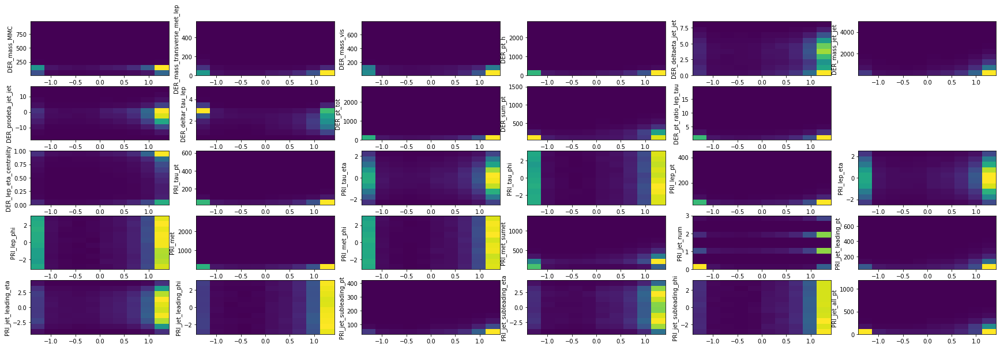

#########################
DER_lep_eta_centrality


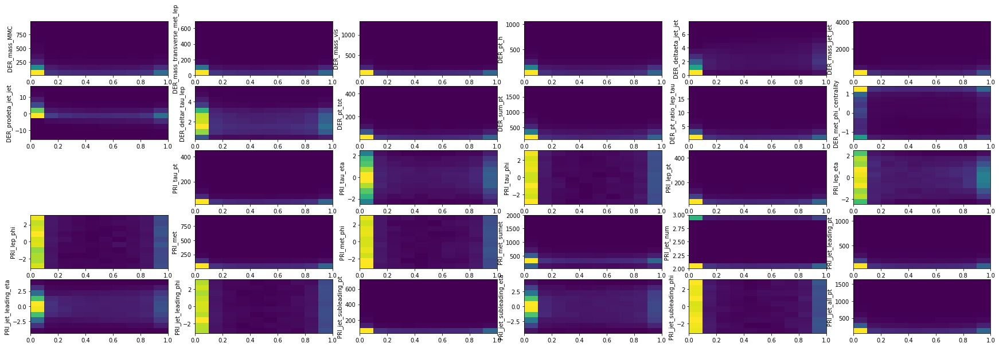

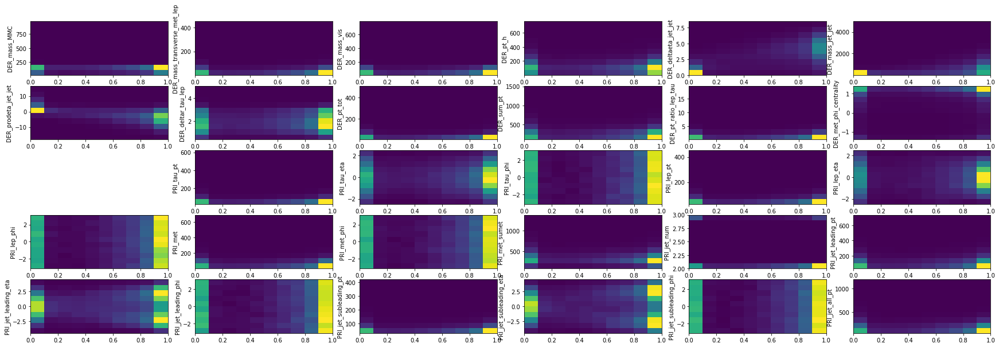

#########################
PRI_tau_pt


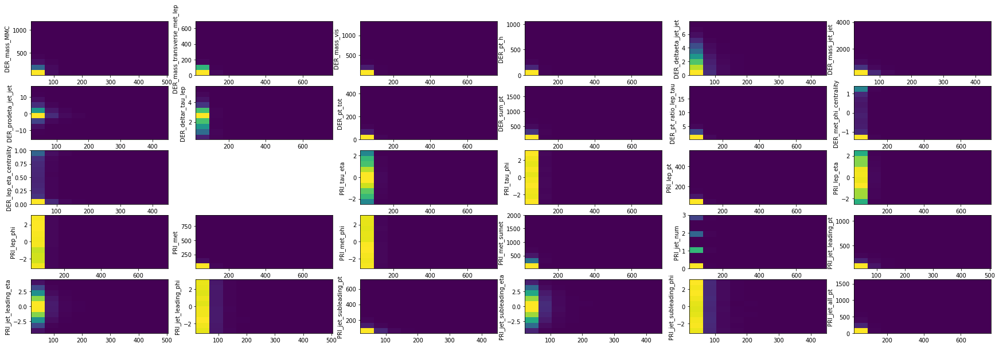

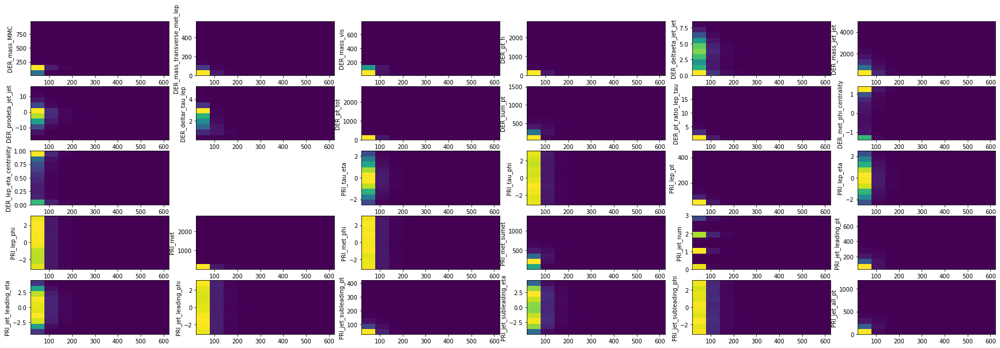

#########################
PRI_tau_eta


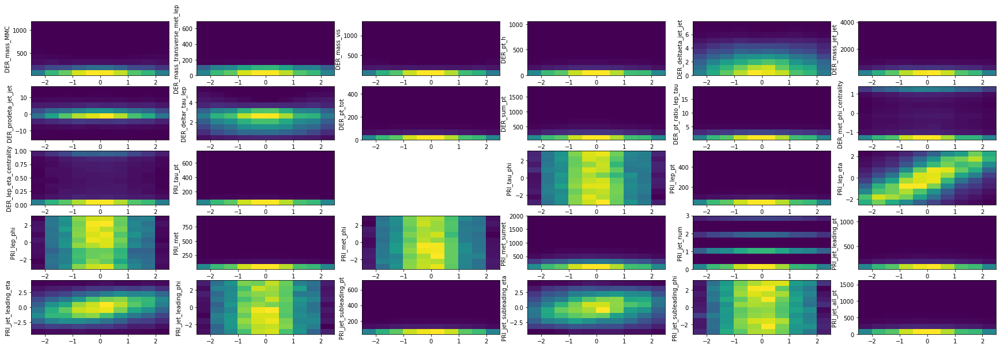

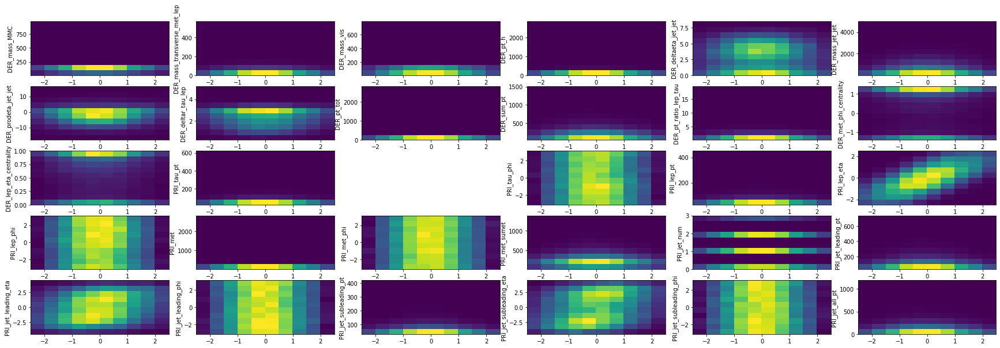

#########################
PRI_tau_phi


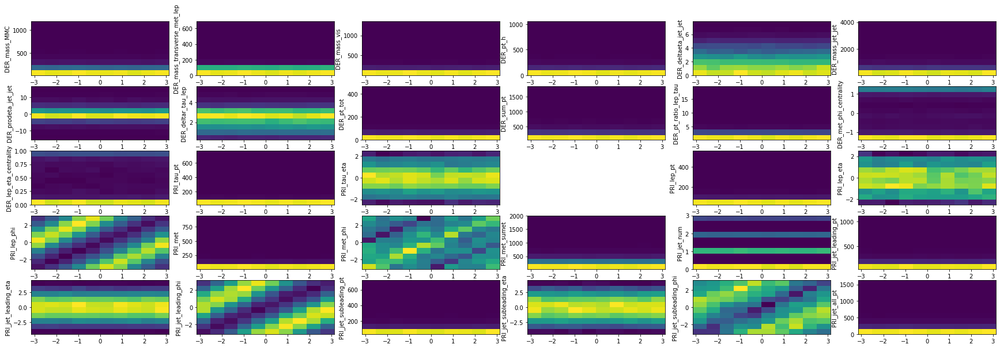

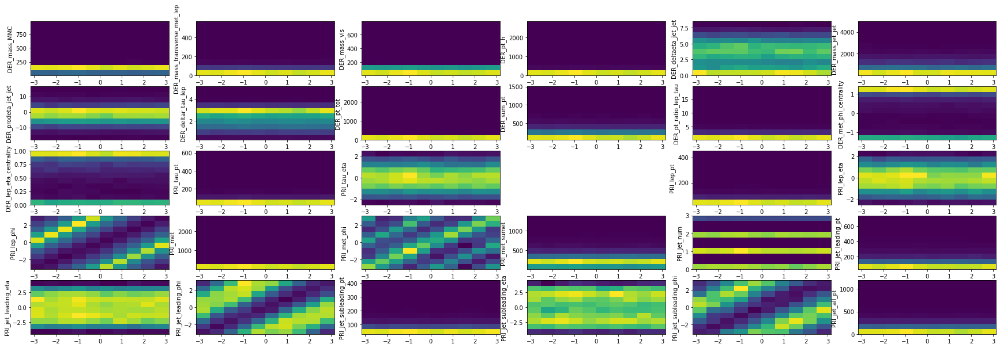

#########################
PRI_lep_pt


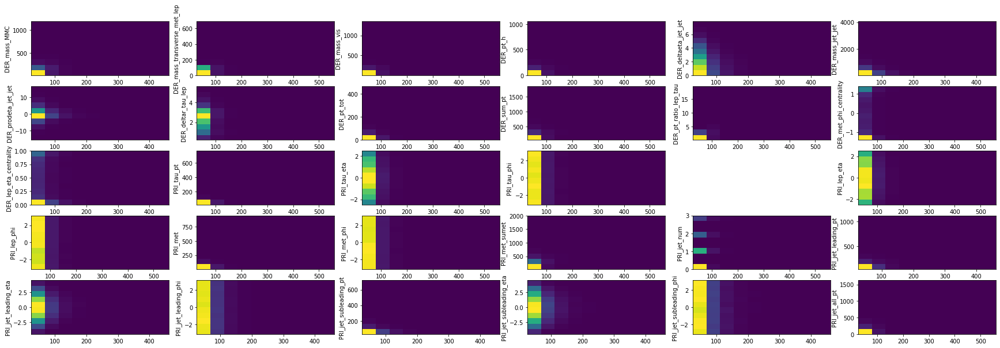

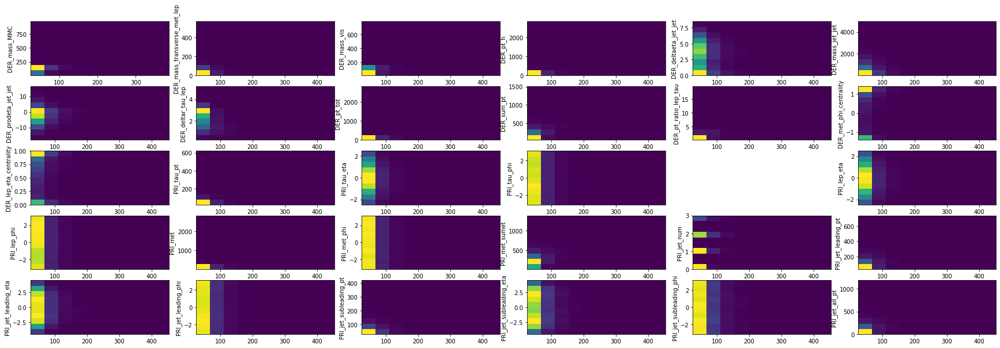

#########################
PRI_lep_eta


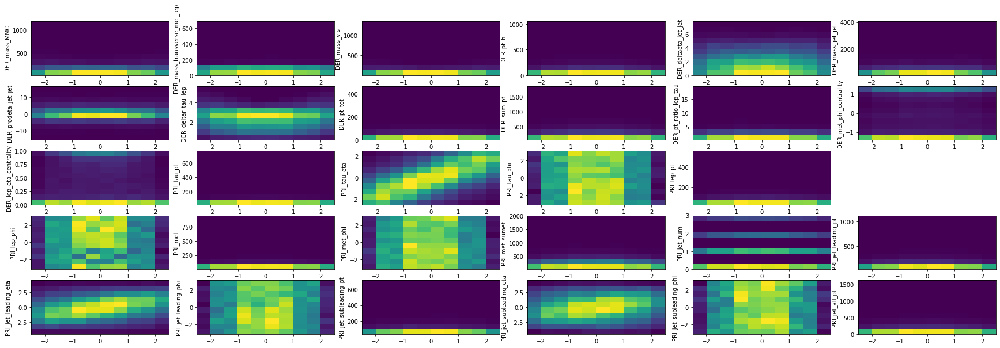

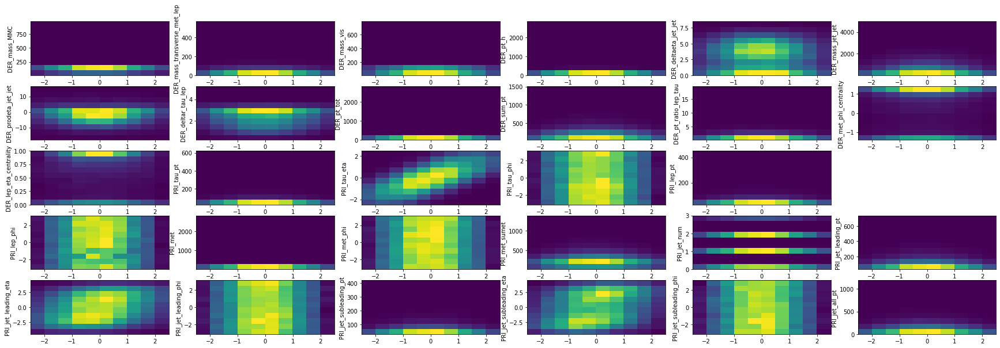

#########################
PRI_lep_phi


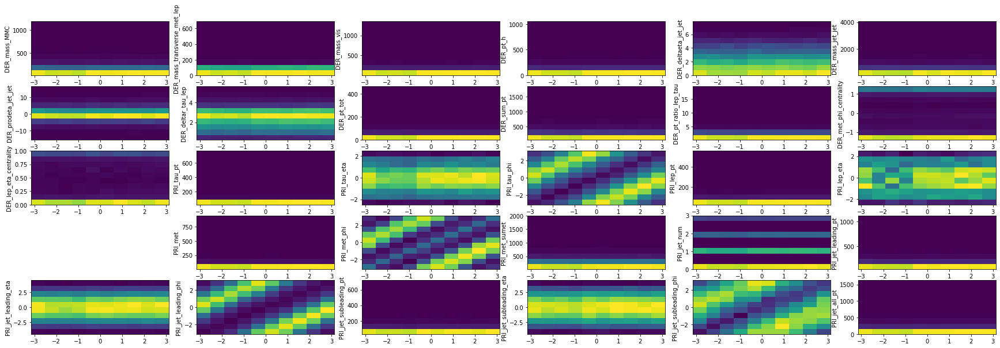

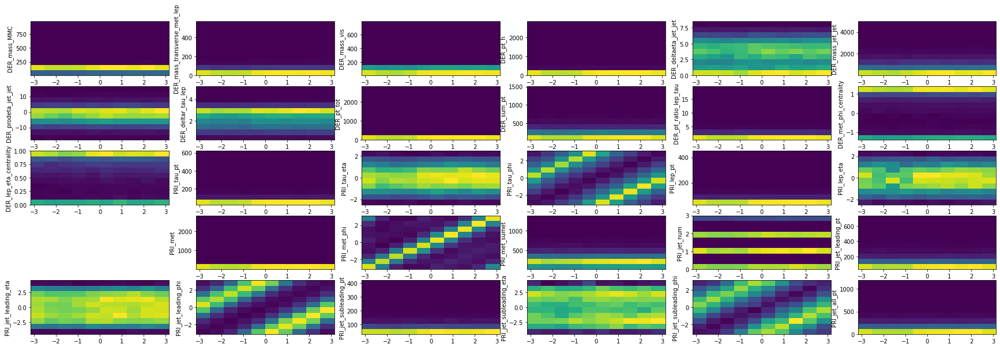

#########################
PRI_met


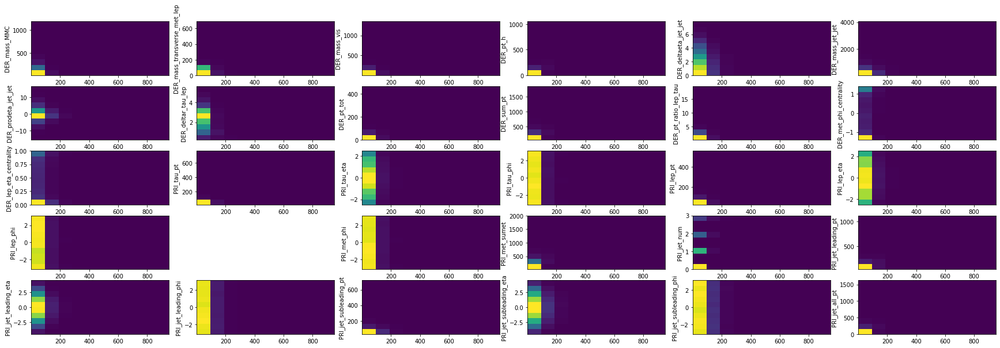

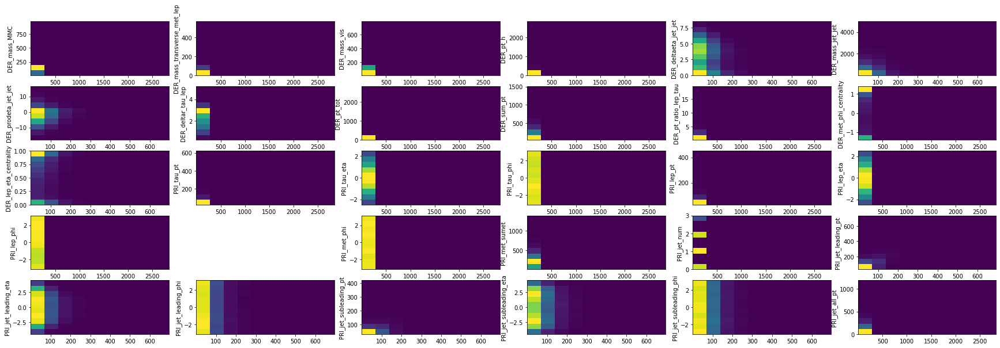

#########################
PRI_met_phi


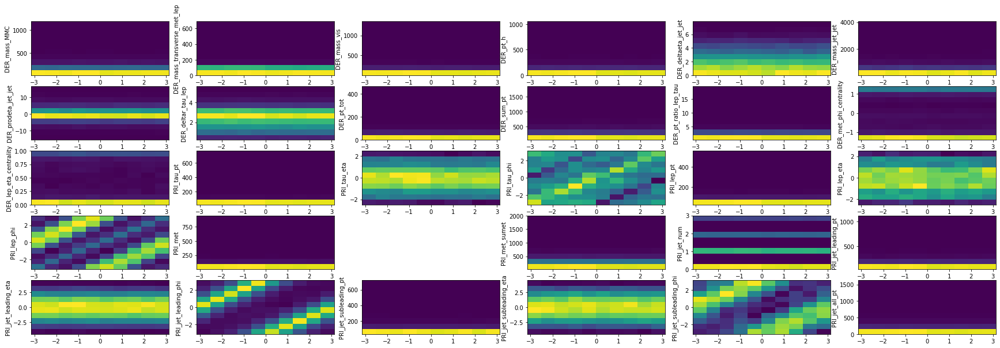

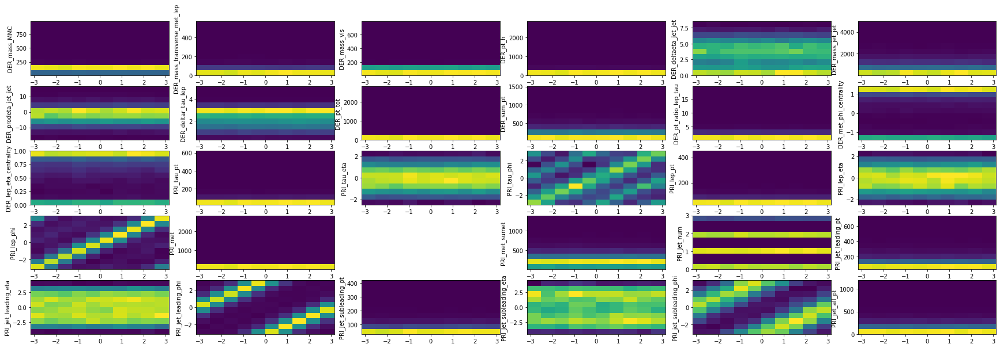

#########################
PRI_met_sumet


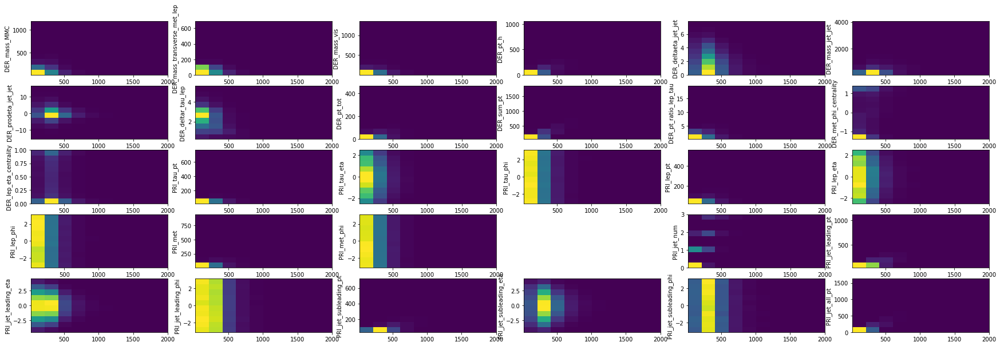

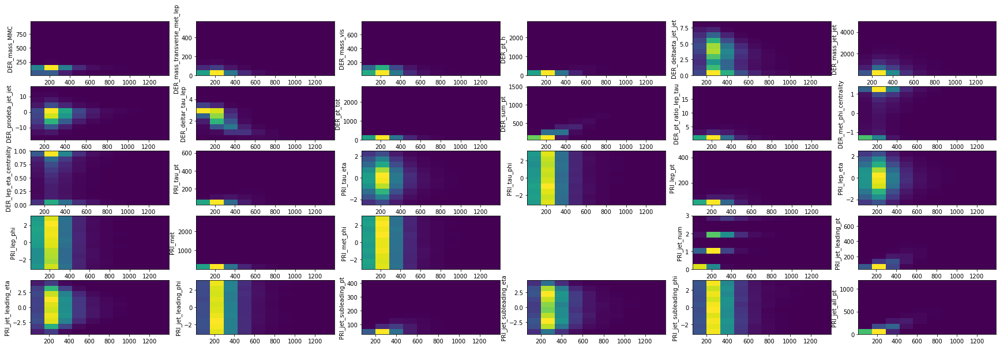

#########################
PRI_jet_num


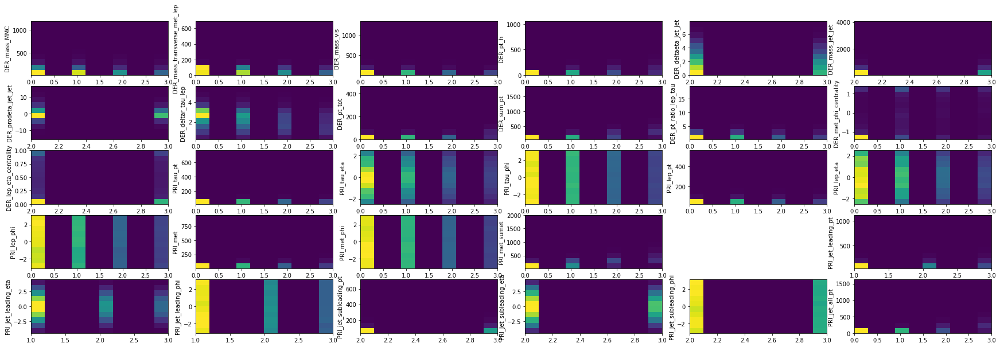

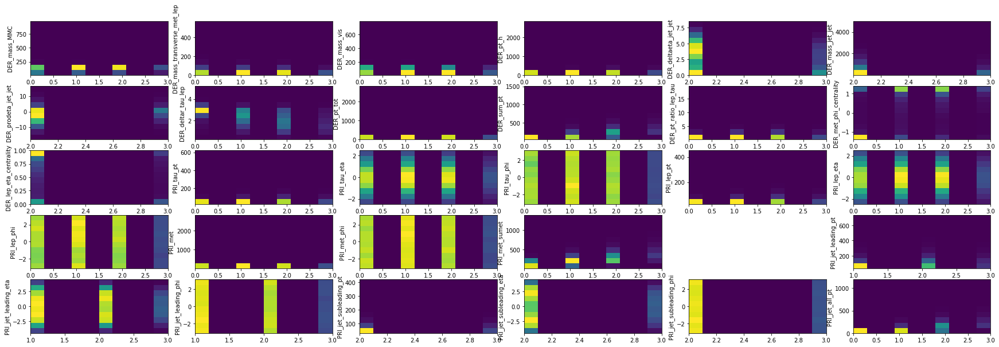

#########################
PRI_jet_leading_pt


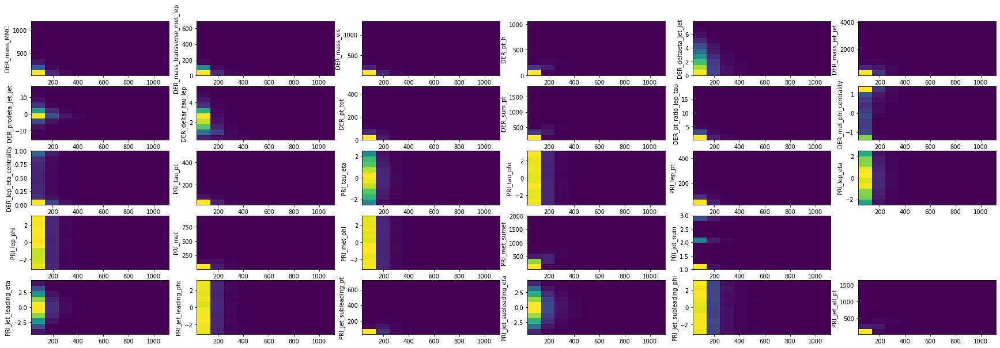

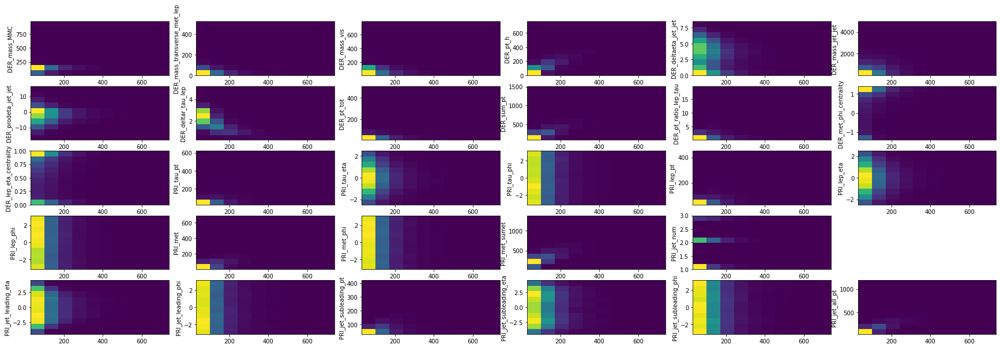

#########################
PRI_jet_leading_eta


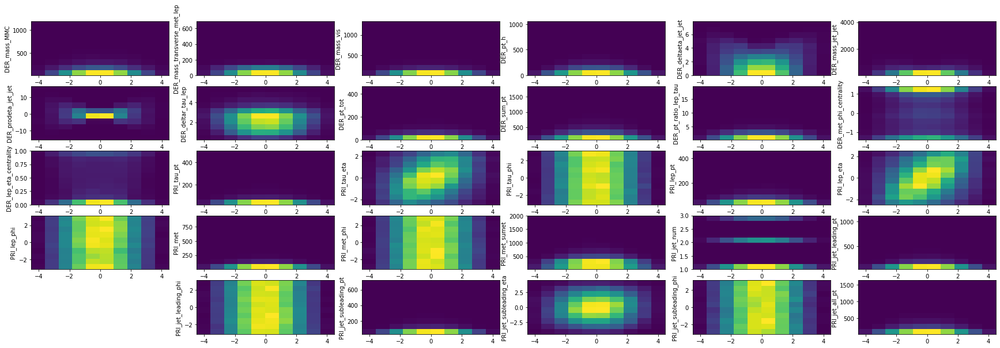

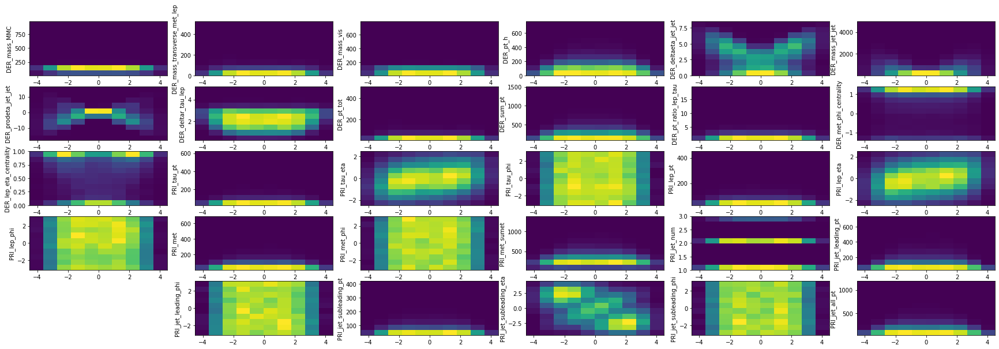

#########################
PRI_jet_leading_phi


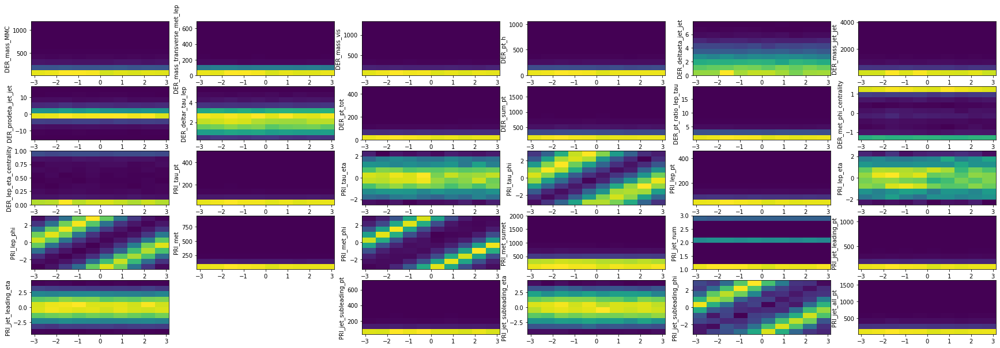

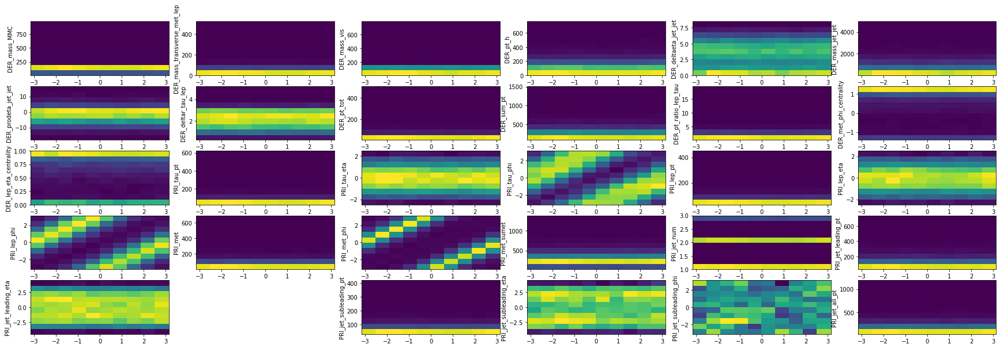

#########################
PRI_jet_subleading_pt


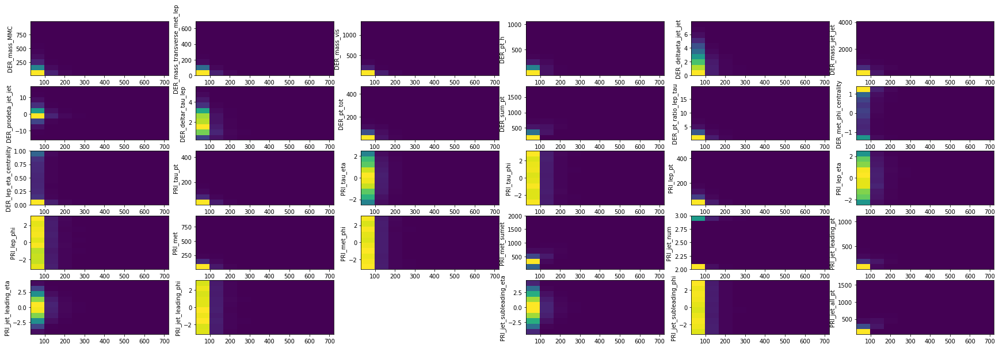

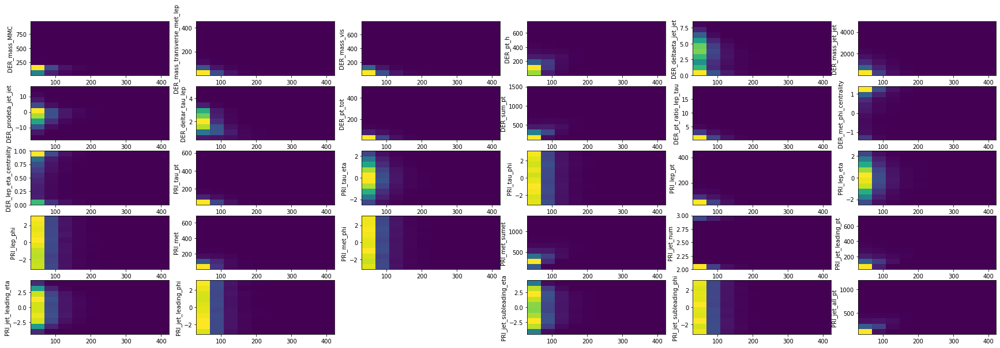

#########################
PRI_jet_subleading_eta


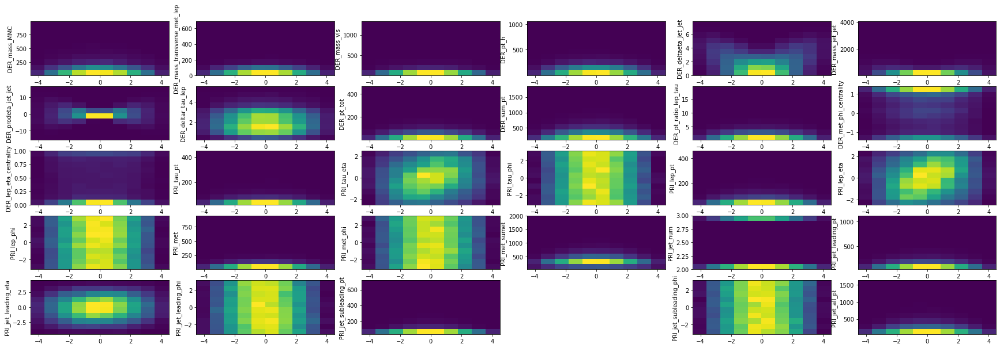

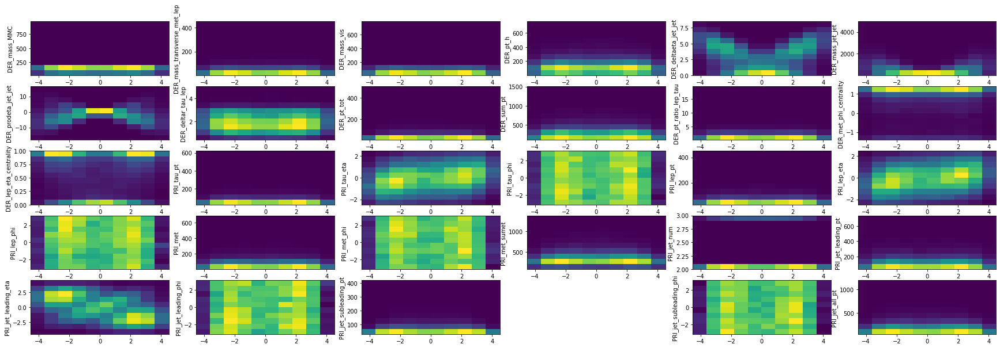

#########################
PRI_jet_subleading_phi


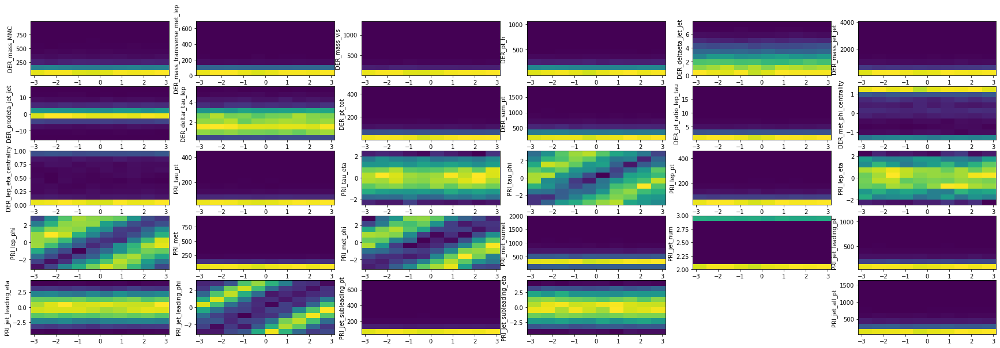

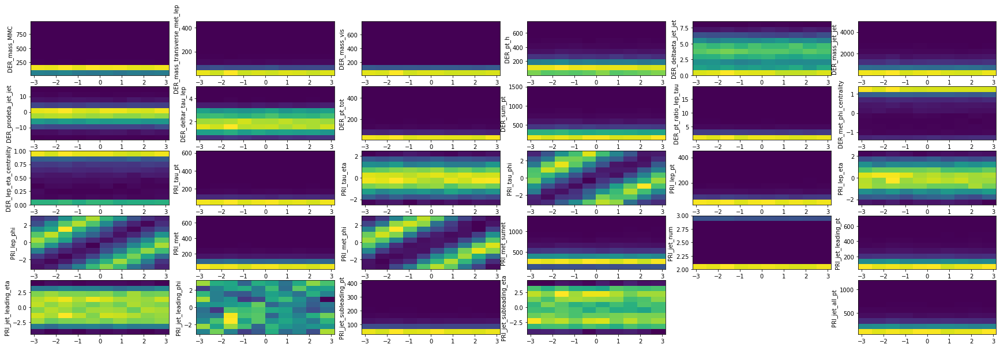

#########################
PRI_jet_all_pt


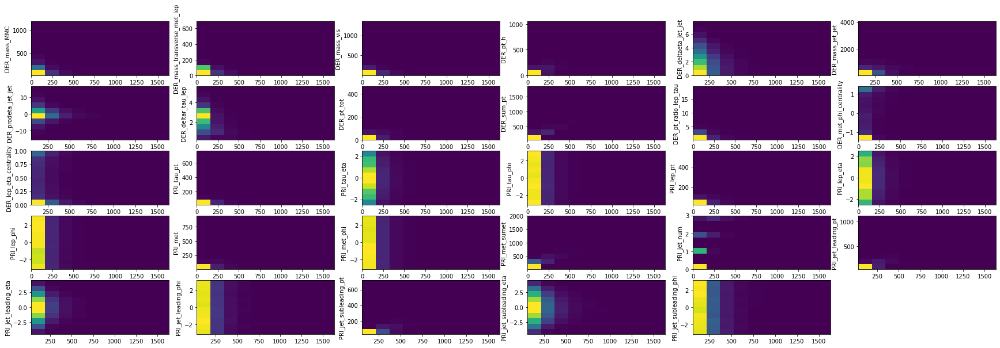

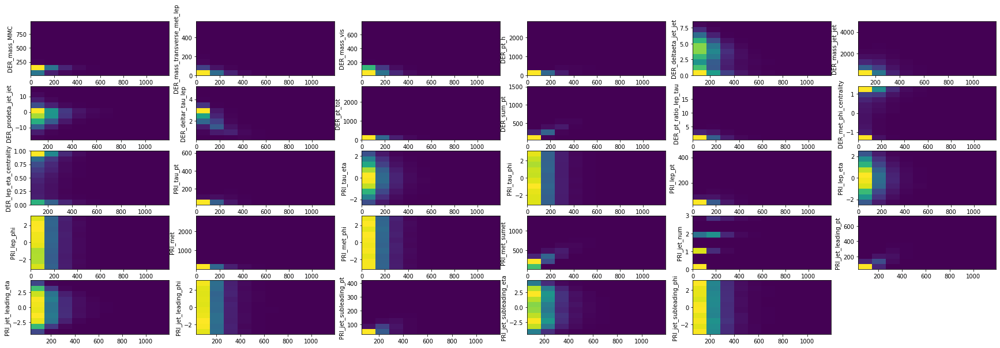

#########################


In [37]:
for i in range(30):
    col = headers[i+2]
    print(col)
    plt.figure(figsize=(30,10))
    for i in range(30):
        col2 = headers[i+2]
        if not col==col2:
            plt.subplot(5,6,i+1)
            #print(col,"\n",col2)
            select = np.logical_and(np.isfinite(data_b[col]), np.isfinite(data_b[col2]))
            plt.hist2d(data_b[col][select], data_b[col2][select])
            plt.ylabel(col2)
    plt.show()
    
    plt.figure(figsize=(30,10))
    for i in range(30):
        col2 = headers[i+2]
        if not col==col2:
            plt.subplot(5,6,i+1)
            #print(col,"\n",col2)
            select = np.logical_and(np.isfinite(data_s[col]), np.isfinite(data_s[col2]))
            plt.hist2d(data_s[col][select], data_s[col2][select])
            plt.ylabel(col2)
    plt.show()
    print("#########################")
    